# Price Channel Detection

In [1]:
import numpy as np
import numba
from scipy.stats import linregress
from tqdm import tqdm
import yfinance as yf
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
@numba.njit
def shift_nb(arr, num, fill_value=np.nan):
    if num >= 0:
        return np.concatenate((np.full(num, fill_value), arr[:-num]))
    else:
        return np.concatenate((arr[-num:], np.full(-num, fill_value)))

def get_ranked_extrema(h, l, max_neighbours=10):
    maxima = np.zeros(shape=(h.shape[0]), dtype=int)
    minima = np.zeros(shape=(h.shape[0]), dtype=int)

    for n in range(1, max_neighbours+1):
        maxima_filter = np.where(maxima == n-1)[0]
        maxima[maxima_filter] += ((h >= shift_nb(h, n)) & (h > shift_nb(h, -n)))[maxima_filter]

        minima_filter = np.where(minima == n-1)[0]
        minima[minima_filter] += ((l <= shift_nb(l, n)) & (l < shift_nb(l, -n)))[minima_filter]

    return maxima, minima

def get_best_channel(
        h, l, c, max_rank_possible=20, min_rank_for_detection=3,
        min_pivot_point_count=3, max_age_latest_pivot_point=20,
        min_r_squared=0.9, max_p_value=0.5, max_crossing_perc=0.05,
        min_pivot_points_inbetween=1):
    # Calculate the rank of each high and low
    all_maxima, all_minima = get_ranked_extrema(h, l, max_rank_possible)

    # Filter out minima whose rank is too low
    all_minima_x = np.where(all_minima >= min_rank_for_detection)[0]
    all_minima_y = l[all_minima_x]
    all_minima_weights = all_minima[all_minima_x]

    # Filter out maxima whose rank is too low
    all_maxima_x = np.where(all_maxima >= min_rank_for_detection)[0]
    all_maxima_y = h[all_maxima_x]
    all_maxima_weights = all_maxima[all_maxima_x]
    
    best_lower_trend_line = None
    best_lower_trend_stats = None
    best_upper_trend_line = None
    best_upper_trend_stats = None
    best_channel_score = -1

    # "Sort minima by their rank and after each iteration remove the minimum with the lowest rank"
    for minima_count in range(min_pivot_point_count, all_minima_x.shape[0]+1):
        minima_comb = np.argpartition(all_minima_weights, -minima_count)[-minima_count:]

        # Get combination of minima
        minima_x = all_minima_x[minima_comb] 
        minima_y = all_minima_y[minima_comb] 
        minima_weights = all_minima_weights[minima_comb]

        # Do linear regression for these minima
        min_slope, min_intercept, min_r, min_p, min_err = linregress(minima_x, minima_y)
        # The coefficient of determination needs to be high enough
        if min_r*min_r <= min_r_squared or min_p >= max_p_value:
            continue
    
        # Calculate the regression line
        min_line_x = np.arange(np.min(minima_x), c.shape[0])
        min_line_y = min_intercept + min_slope * min_line_x
        # Calculate the crossing price percentage
        min_crossing_price_perc = np.mean(c[min_line_x] < min_line_y)
        # This needs to be sufficiently small
        if min_crossing_price_perc >= max_crossing_perc:
            continue

        # "Sort maxima by their rank and after each iteration remove the maximum with the lowest rank"
        for maxima_count in range(min_pivot_point_count, all_maxima_x.shape[0]+1):
            maxima_comb = np.argpartition(all_maxima_weights, -maxima_count)[-maxima_count:]
            
            # Get combination of maxima
            maxima_x = all_maxima_x[maxima_comb] 
            maxima_y = all_maxima_y[maxima_comb] 
            maxima_weights = all_maxima_weights[maxima_comb]

            # At least <min_pivot_points_inbetween> minima need to be between the first and the last maxima
            if np.sum((np.min(maxima_x) <= minima_x) & (minima_x <= np.max(maxima_x))) < min_pivot_points_inbetween:
                continue
            # At least <min_pivot_points_inbetween> maxima need to be between the first and the last minima
            if np.sum((np.min(minima_x) <= maxima_x) & (maxima_x <= np.max(minima_x))) < min_pivot_points_inbetween:
                continue

            # Do linear regression for these maxima
            max_slope, max_intercept, max_r, max_p, max_err = linregress(maxima_x, maxima_y)
            # The coefficient of determination needs to be high enough
            if max_r*max_r <= min_r_squared or max_p >= max_p_value:
                continue

            # Calculate the regression line
            max_line_x = np.arange(np.min(maxima_x), c.shape[0])
            max_line_y = max_intercept + max_slope * max_line_x
            # Calculate the crossing price percentage
            max_crossing_price_perc = np.mean(c[max_line_x] > max_line_y)
            # This needs to be sufficiently small
            if max_crossing_price_perc >= max_crossing_perc:
                continue

            # The latest pivot point should not be too old
            if c.shape[0] - max(np.max(minima_x), np.max(maxima_x)) > max_age_latest_pivot_point:
                continue

            # Calculate a score that makes channel A better than channel B (difficult and can be definitely changed)
            channel_score = (np.sum(minima_weights) * np.sum(maxima_weights)) * min_r*min_r * max_r*max_r * (1-min_p)*(1-max_p)

            if best_channel_score < channel_score:
                best_channel_score = channel_score
                best_lower_trend_line = {
                    "line_x": min_line_x,
                    "line_y": min_line_y,
                    "points_x": minima_x,
                    "points_y": minima_y,
                    "points_weights": minima_weights
                }
                best_lower_trend_stats = {
                    "slope": min_slope,
                    "intercept": min_intercept,
                    "r": min_r,
                    "p": min_p,
                    "err": min_err,
                    "crossing_price_perc": min_crossing_price_perc
                }
                best_upper_trend_line = {
                    "line_x": max_line_x,
                    "line_y": max_line_y,
                    "points_x": maxima_x,
                    "points_y": maxima_y,
                    "points_weights": maxima_weights
                }
                best_upper_trend_stats = {
                    "slope": max_slope,
                    "intercept": max_intercept,
                    "r": max_r,
                    "p": max_p,
                    "err": max_err,
                    "crossing_price_perc": max_crossing_price_perc
                }
                        
    return best_lower_trend_line, best_lower_trend_stats, best_upper_trend_line, best_upper_trend_stats, best_channel_score

In [3]:
ohlcv = yf.download("SAIL.NS", period="max")

[*********************100%%**********************]  1 of 1 completed


In [4]:
ohlcv

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1996-01-01,26.750000,27.000000,26.500000,26.750000,16.148354,28000
1996-01-02,26.750000,26.900000,26.250000,26.250000,15.846514,59000
1996-01-03,26.250000,26.900000,26.250000,26.299999,15.876697,31500
1996-01-04,26.299999,26.500000,26.000000,26.500000,15.997435,33500
1996-01-05,26.500000,26.799999,26.250000,26.299999,15.876697,21000
...,...,...,...,...,...,...
2024-01-24,109.849998,115.500000,109.000000,115.050003,115.050003,37267385
2024-01-25,115.900002,119.949997,114.000000,119.099998,119.099998,62850007
2024-01-29,120.500000,121.650002,118.000000,120.449997,120.449997,45734036


  4%|███████                                                                                                                                                                   | 290/6980 [00:01<00:17, 384.69it/s]

 best_lower_trend_line:  {'line_x': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([19.45714269, 19.42199231, 19.38684192, 19.35169154, 19.31654116,
       19.28139077, 19.24624039, 19.21109   , 19.17593962, 19.14078923,
       19.10563885, 19.07048846, 19.03533808, 19.00018769, 18.96503731,
       18.92988693, 18.89473654, 18.85958616, 18.82443577, 18.78928539,
       18.754135  , 18.71898462, 18.68383423, 18.64868385, 18.61353346,
       18.57838308, 18.5432327 , 18.50808231, 18.47293193, 18.43778154,
       18.40263116, 18.36748077, 18.33233039, 18.29718   , 18.26202962,
       18.22687923, 18.19172885, 18.15657847, 18.12142808, 18.0862777 ,
       18.05112731, 18.01597693, 17.98082654, 17.

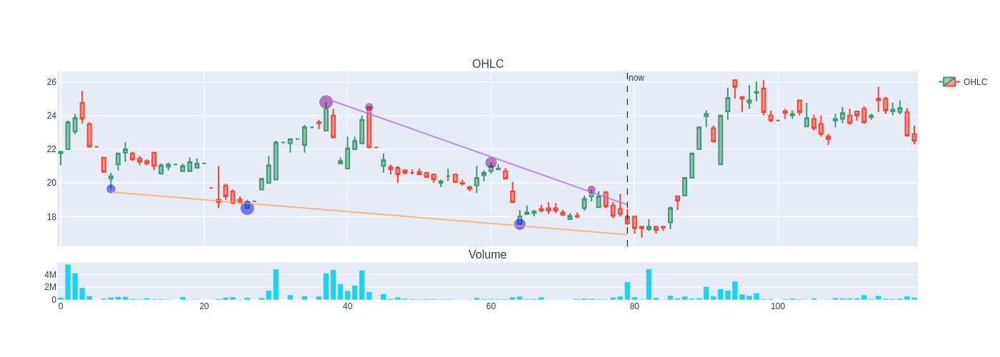

Hit any key for the next plot! 'q' for exit. 


  7%|███████████▏                                                                                                                                                               | 455/6980 [00:04<01:07, 96.43it/s]

 best_lower_trend_line:  {'line_x': array([20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([9.81562994, 9.76431171, 9.71299349, 9.66167526, 9.61035703,
       9.55903881, 9.50772058, 9.45640236, 9.40508413, 9.3537659 ,
       9.30244768, 9.25112945, 9.19981122, 9.148493  , 9.09717477,
       9.04585655, 8.99453832, 8.94322009, 8.89190187, 8.84058364,
       8.78926541, 8.73794719, 8.68662896, 8.63531074, 8.58399251,
       8.53267428, 8.48135606, 8.43003783, 8.37871961, 8.32740138,
       8.27608315, 8.22476493, 8.1734467 , 8.12212847, 8.07081025,
       8.01949202, 7.9681738 , 7.91685557, 7.86553734, 7.81421912,
       7.76290089, 7.71158266, 7.66026444, 7.60894621, 7.55762799,
       7.50630976, 7.45499153, 7.40367331, 7.35235508, 7.30103686,
       7.24971

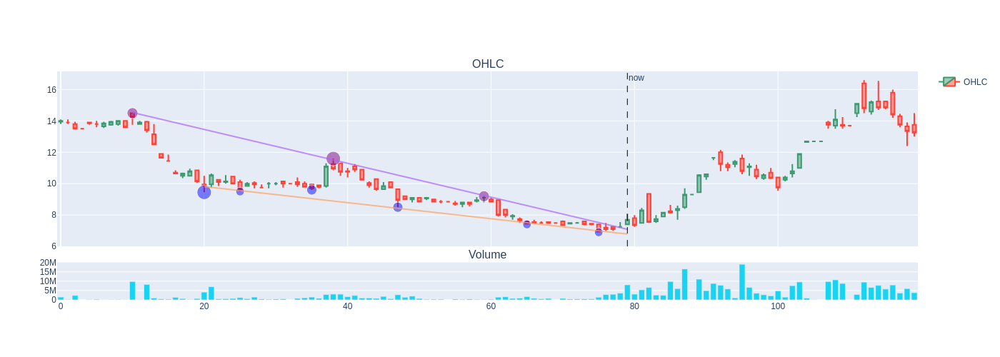

Hit any key for the next plot! 'q' for exit. 


  8%|█████████████▍                                                                                                                                                             | 548/6980 [00:05<01:10, 91.19it/s]

 best_lower_trend_line:  {'line_x': array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([11.91900999, 11.82249707, 11.72598415, 11.62947123, 11.53295831,
       11.43644538, 11.33993246, 11.24341954, 11.14690662, 11.0503937 ,
       10.95388078, 10.85736785, 10.76085493, 10.66434201, 10.56782909,
       10.47131617, 10.37480325, 10.27829032, 10.1817774 , 10.08526448,
        9.98875156,  9.89223864,  9.79572572,  9.6992128 ,  9.60269987,
        9.50618695,  9.40967403,  9.31316111,  9.21664819,  9.12013527,
        9.02362234,  8.92710942,  8.8305965 ,  8.73408358,  8.63757066,
        8.54105774,  8.44454481,  8.34803189,  8.25151897,  8.15500605,
        8.05849313,  7.96198021,  7.86546728,  7.76895436,  7.67244144,
        7.57592852,  7.4794156 ,  7.38290268,  7.28638975,  7.189876

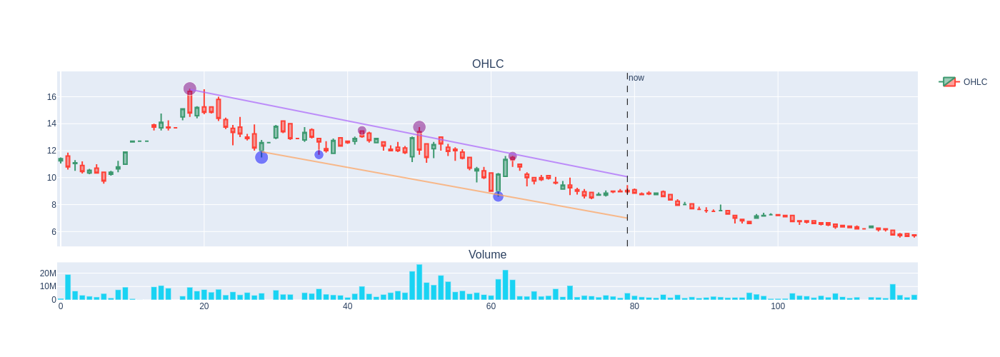

Hit any key for the next plot! 'q' for exit. 


  8%|██████████████▎                                                                                                                                                            | 586/6980 [00:07<01:58, 53.96it/s]

 best_lower_trend_line:  {'line_x': array([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([11.7964772 , 11.7161794 , 11.63588159, 11.55558379, 11.47528598,
       11.39498818, 11.31469037, 11.23439257, 11.15409476, 11.07379696,
       10.99349916, 10.91320135, 10.83290355, 10.75260574, 10.67230794,
       10.59201013, 10.51171233, 10.43141452, 10.35111672, 10.27081891,
       10.19052111, 10.11022331, 10.0299255 ,  9.9496277 ,  9.86932989,
        9.78903209,  9.70873428,  9.62843648,  9.54813867,  9.46784087,
        9.38754307,  9.30724526,  9.22694746,  9.14664965,  9.06635185,
        8.98605404,  8.90575624,  8.82545843,  8.74516063,  8.66486282,
        8.58456502,  8.50426722,  8.42396941,  8.34367161,  8.2633738 ,
        8.183076  ,  8.10277

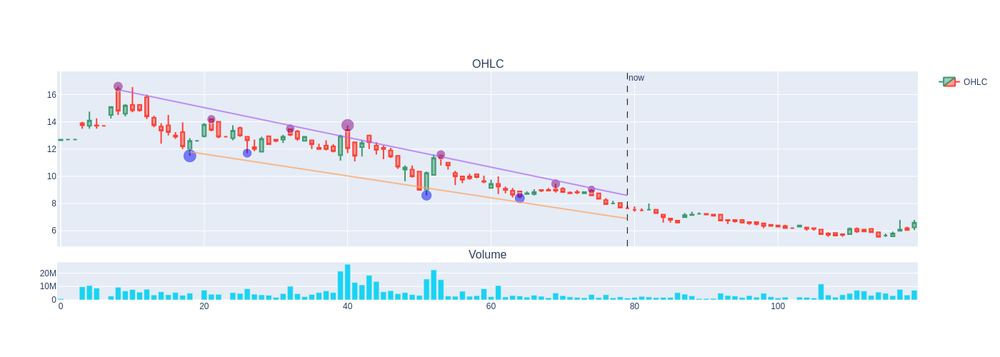

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
       76, 77, 78, 79]), 'line_y': array([12.04322567, 11.96367879, 11.88413191, 11.80458503, 11.72503816,
       11.64549128, 11.5659444 , 11.48639752, 11.40685064, 11.32730376,
       11.24775688, 11.16821   , 11.08866313, 11.00911625, 10.92956937,
       10.85002249, 10.77047561, 10.69092873, 10.61138185, 10.53183497,
       10.4522881 , 10.37274122, 10.29319434, 10.21364746, 10.13410058,
       10.0545537 ,  9.97500682,  9.89545994,  9.81591307,  9.73636619,
        9.65681931,  9.57727243,  9.49772555,  9.41817867,  9.33863179,
        9.25908491,  9.17953804,  9.09999116,  9.02044428,  8.9408974 ,
        8.86135052,  8.78180364,  8.70225676,  8.6227

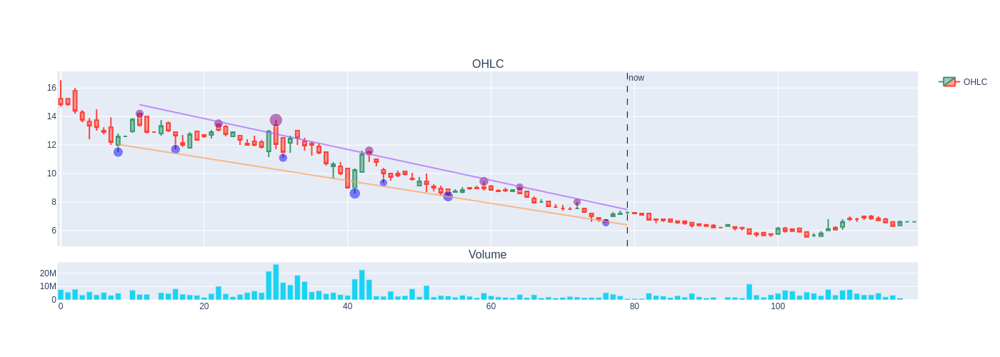

Hit any key for the next plot! 'q' for exit. 


 10%|████████████████▎                                                                                                                                                          | 667/6980 [00:09<02:00, 52.32it/s]

 best_lower_trend_line:  {'line_x': array([23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
       40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
       57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73,
       74, 75, 76, 77, 78, 79]), 'line_y': array([5.51415544, 5.50143711, 5.48871879, 5.47600046, 5.46328213,
       5.4505638 , 5.43784547, 5.42512715, 5.41240882, 5.39969049,
       5.38697216, 5.37425384, 5.36153551, 5.34881718, 5.33609885,
       5.32338052, 5.3106622 , 5.29794387, 5.28522554, 5.27250721,
       5.25978888, 5.24707056, 5.23435223, 5.2216339 , 5.20891557,
       5.19619724, 5.18347892, 5.17076059, 5.15804226, 5.14532393,
       5.13260561, 5.11988728, 5.10716895, 5.09445062, 5.08173229,
       5.06901397, 5.05629564, 5.04357731, 5.03085898, 5.01814065,
       5.00542233, 4.992704  , 4.97998567, 4.96726734, 4.95454902,
       4.94183069, 4.92911236, 4.91639403, 4.9036757 , 4.89095738,
       4.87823905, 4.86552

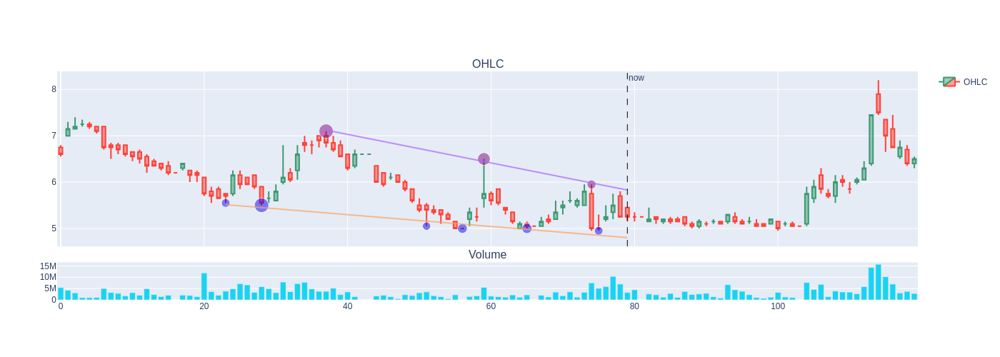

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
       30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,
       64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([5.51415544, 5.50143711, 5.48871879, 5.47600046, 5.46328213,
       5.4505638 , 5.43784547, 5.42512715, 5.41240882, 5.39969049,
       5.38697216, 5.37425384, 5.36153551, 5.34881718, 5.33609885,
       5.32338052, 5.3106622 , 5.29794387, 5.28522554, 5.27250721,
       5.25978888, 5.24707056, 5.23435223, 5.2216339 , 5.20891557,
       5.19619724, 5.18347892, 5.17076059, 5.15804226, 5.14532393,
       5.13260561, 5.11988728, 5.10716895, 5.09445062, 5.08173229,
       5.06901397, 5.05629564, 5.04357731, 5.03085898, 5.01814065,
       5.00542233, 4.992704  , 4.97998567, 4.96726734, 4.95454902,
       4.94183069, 4.92911236, 4.91639403, 4.9036757 

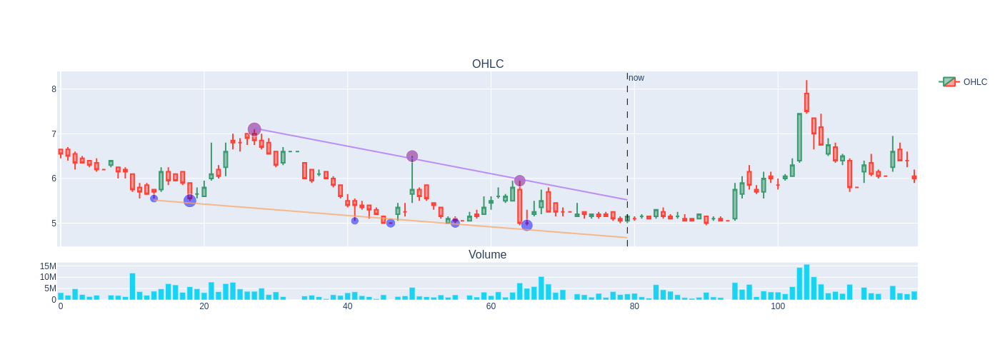

Hit any key for the next plot! 'q' for exit. 


 11%|██████████████████▍                                                                                                                                                        | 754/6980 [00:11<01:48, 57.34it/s]

 best_lower_trend_line:  {'line_x': array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
       76, 77, 78, 79]), 'line_y': array([5.71865913, 5.70623241, 5.6938057 , 5.68137898, 5.66895227,
       5.65652555, 5.64409884, 5.63167212, 5.61924541, 5.60681869,
       5.59439198, 5.58196526, 5.56953854, 5.55711183, 5.54468511,
       5.5322584 , 5.51983168, 5.50740497, 5.49497825, 5.48255154,
       5.47012482, 5.45769811, 5.44527139, 5.43284467, 5.42041796,
       5.40799124, 5.39556453, 5.38313781, 5.3707111 , 5.35828438,
       5.34585767, 5.33343095, 5.32100424, 5.30857752, 5.2961508 ,
       5.28372409, 5.27129737, 5.25887066, 5.24644394, 5.23401723,
       5.22159051, 5.2091638 , 5.19673708, 5.18431037, 5.17188365,
       5.15945693, 5.14703

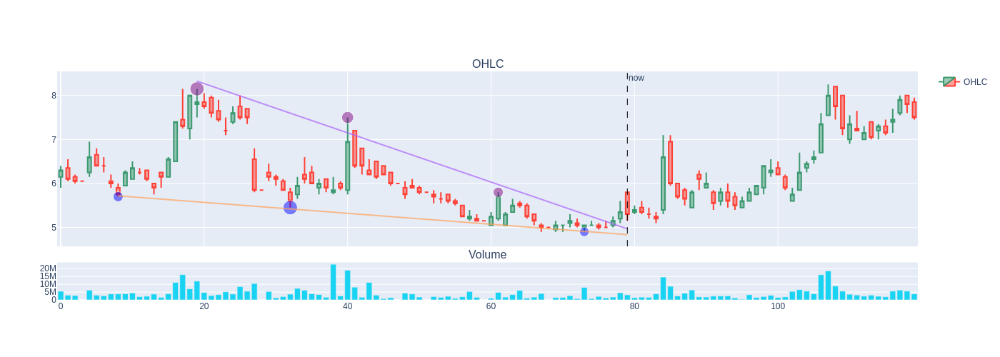

Hit any key for the next plot! 'q' for exit. 


 12%|████████████████████▍                                                                                                                                                      | 832/6980 [00:11<01:12, 84.78it/s]

 best_lower_trend_line:  {'line_x': array([38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([4.88278014, 4.90726146, 4.93174278, 4.95622411, 4.98070543,
       5.00518676, 5.02966808, 5.05414941, 5.07863073, 5.10311205,
       5.12759338, 5.1520747 , 5.17655603, 5.20103735, 5.22551868,
       5.25      , 5.27448132, 5.29896265, 5.32344397, 5.3479253 ,
       5.37240662, 5.39688795, 5.42136927, 5.44585059, 5.47033192,
       5.49481324, 5.51929457, 5.54377589, 5.56825722, 5.59273854,
       5.61721986, 5.64170119, 5.66618251, 5.69066384, 5.71514516,
       5.73962648, 5.76410781, 5.78858913, 5.81307046, 5.83755178,
       5.86203311, 5.88651443]), 'points_x': array([48, 67, 59, 38]), 'points_y': array([5.0999999, 5.5999999, 5.4000001, 4.9000001]), 'points_weights': array([ 5,  6,  9, 20])}
best_lower_trend_stats:  {'slope': 0.024481324239

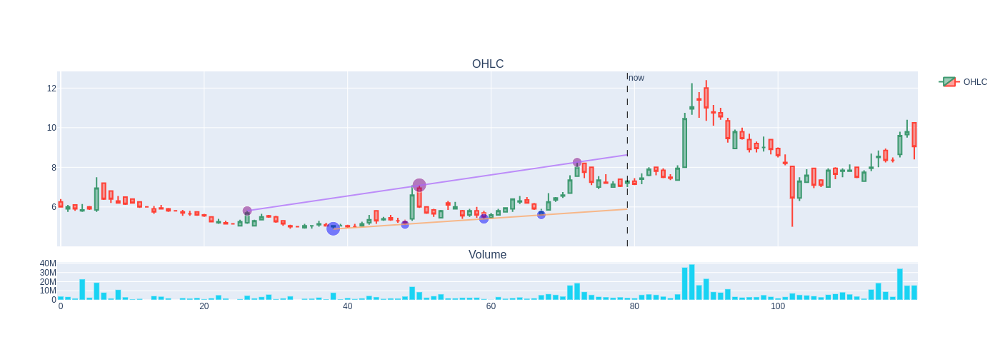

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([4.88278014, 4.90726146, 4.93174278, 4.95622411, 4.98070543,
       5.00518676, 5.02966808, 5.05414941, 5.07863073, 5.10311205,
       5.12759338, 5.1520747 , 5.17655603, 5.20103735, 5.22551868,
       5.25      , 5.27448132, 5.29896265, 5.32344397, 5.3479253 ,
       5.37240662, 5.39688795, 5.42136927, 5.44585059, 5.47033192,
       5.49481324, 5.51929457, 5.54377589, 5.56825722, 5.59273854,
       5.61721986, 5.64170119, 5.66618251, 5.69066384, 5.71514516,
       5.73962648, 5.76410781, 5.78858913, 5.81307046, 5.83755178,
       5.86203311, 5.88651443, 5.91099575, 5.93547708, 5.9599584 ,
       5.98443973, 6.00892105, 6.03340238, 6.0578837 , 6.08236502,
       6.10684635, 6.13132767]), 'points_x': a

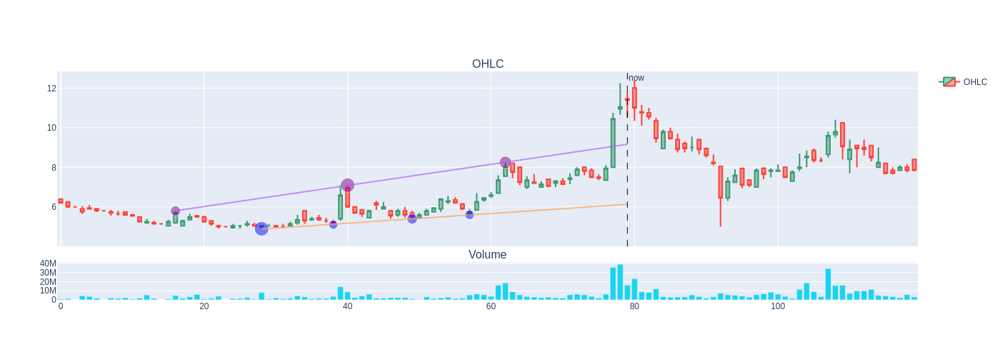

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([4.88278014, 4.90726146, 4.93174278, 4.95622411, 4.98070543,
       5.00518676, 5.02966808, 5.05414941, 5.07863073, 5.10311205,
       5.12759338, 5.1520747 , 5.17655603, 5.20103735, 5.22551868,
       5.25      , 5.27448132, 5.29896265, 5.32344397, 5.3479253 ,
       5.37240662, 5.39688795, 5.42136927, 5.44585059, 5.47033192,
       5.49481324, 5.51929457, 5.54377589, 5.56825722, 5.59273854,
       5.61721986, 5.64170119, 5.66618251, 5.69066384, 5.71514516,
       5.73962648, 5.76410781, 5.78858913, 5.81307046, 5.83755178,
       5.86203311, 5.88651443, 5.91099575, 5.93547708, 5.9599584 ,
       5.98443973, 6.00892105, 6.03340238, 6.0578837 , 6.08236502,
  

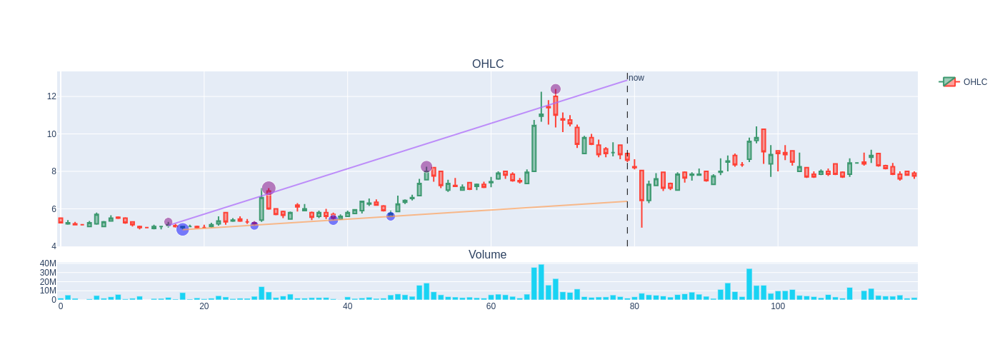

Hit any key for the next plot! 'q' for exit. 


 16%|██████████████████████████▊                                                                                                                                              | 1109/6980 [00:14<00:33, 175.17it/s]

 best_lower_trend_line:  {'line_x': array([31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([6.39782399, 6.38003022, 6.36223645, 6.34444268, 6.32664891,
       6.30885514, 6.29106137, 6.2732676 , 6.25547383, 6.23768006,
       6.21988629, 6.20209252, 6.18429875, 6.16650498, 6.14871121,
       6.13091744, 6.11312367, 6.0953299 , 6.07753613, 6.05974236,
       6.04194859, 6.02415482, 6.00636105, 5.98856728, 5.97077351,
       5.95297974, 5.93518597, 5.9173922 , 5.89959843, 5.88180466,
       5.86401089, 5.84621712, 5.82842335, 5.81062958, 5.79283581,
       5.77504204, 5.75724827, 5.7394545 , 5.72166073, 5.70386696,
       5.68607319, 5.66827942, 5.65048565, 5.63269188, 5.61489811,
       5.59710434, 5.57931057, 5.5615168 , 5.54372303]), 'points_x': array([48, 31, 68, 58]), 'points_y': array([6.1500001 , 6.40000

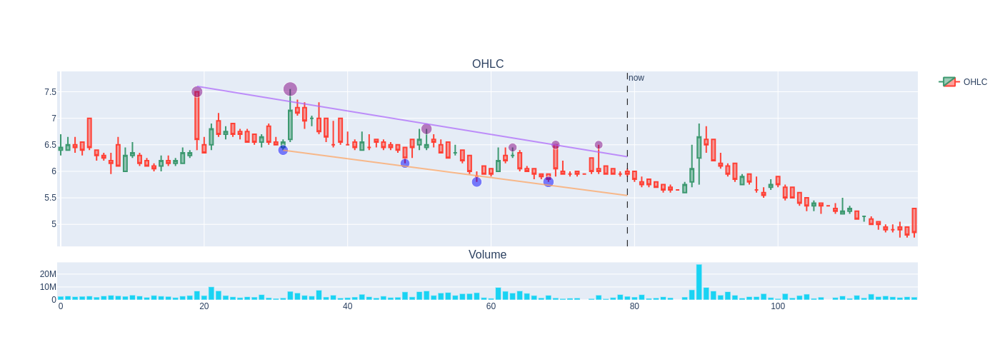

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
       38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([6.39782399, 6.38003022, 6.36223645, 6.34444268, 6.32664891,
       6.30885514, 6.29106137, 6.2732676 , 6.25547383, 6.23768006,
       6.21988629, 6.20209252, 6.18429875, 6.16650498, 6.14871121,
       6.13091744, 6.11312367, 6.0953299 , 6.07753613, 6.05974236,
       6.04194859, 6.02415482, 6.00636105, 5.98856728, 5.97077351,
       5.95297974, 5.93518597, 5.9173922 , 5.89959843, 5.88180466,
       5.86401089, 5.84621712, 5.82842335, 5.81062958, 5.79283581,
       5.77504204, 5.75724827, 5.7394545 , 5.72166073, 5.70386696,
       5.68607319, 5.66827942, 5.65048565, 5.63269188, 5.61489811,
       5.59710434, 5.57931057, 5.5615168 , 5.54372303, 5.52592926,
       5.50813549,

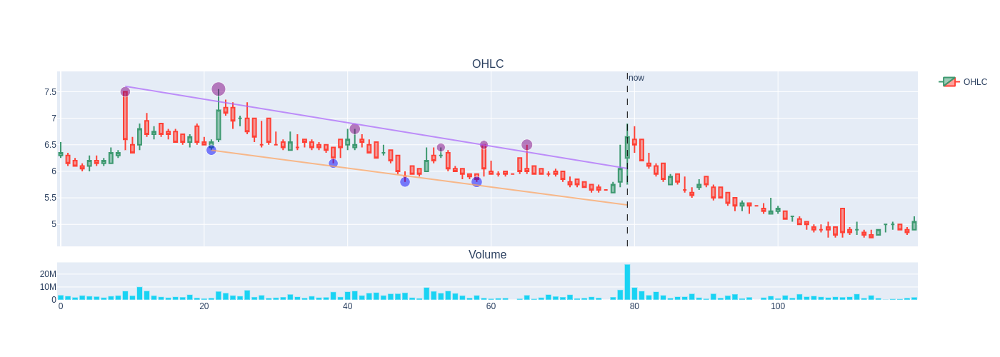

Hit any key for the next plot! 'q' for exit. 


 17%|█████████████████████████████                                                                                                                                            | 1200/6980 [00:15<00:52, 110.74it/s]

 best_lower_trend_line:  {'line_x': array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,
       53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
       70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([4.76659934, 4.79005287, 4.8135064 , 4.83695993, 4.86041346,
       4.88386699, 4.90732053, 4.93077406, 4.95422759, 4.97768112,
       5.00113465, 5.02458818, 5.04804171, 5.07149524, 5.09494878,
       5.11840231, 5.14185584, 5.16530937, 5.1887629 , 5.21221643,
       5.23566996, 5.2591235 , 5.28257703, 5.30603056, 5.32948409,
       5.35293762, 5.37639115, 5.39984468, 5.42329821, 5.44675175,
       5.47020528, 5.49365881, 5.51711234, 5.54056587, 5.5640194 ,
       5.58747293, 5.61092647, 5.63438   , 5.65783353, 5.68128706,
       5.70474059, 5.72819412, 5.75164765, 5.77510118, 5.79855472,
       5.82200825, 5.84546178, 5.86891531, 5.89236884, 5.91582237,
       5.9

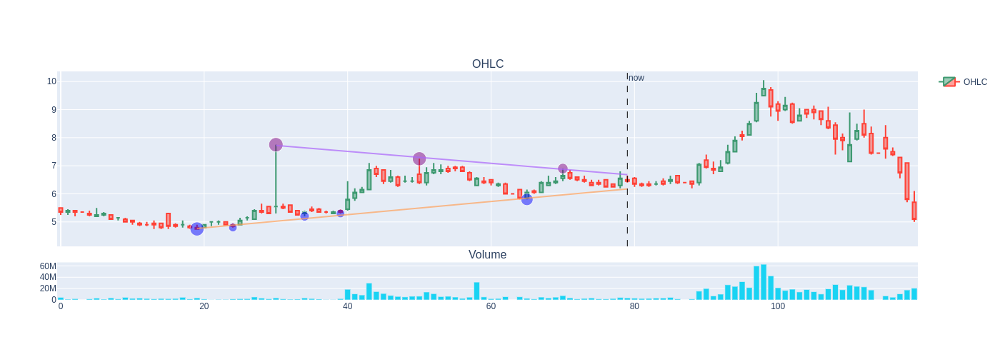

Hit any key for the next plot! 'q' for exit. 


 18%|█████████████████████████████▉                                                                                                                                           | 1237/6980 [00:15<00:49, 116.55it/s]

 best_lower_trend_line:  {'line_x': array([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
       26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76,
       77, 78, 79]), 'line_y': array([4.76239033, 4.7862522 , 4.81011406, 4.83397593, 4.85783779,
       4.88169965, 4.90556152, 4.92942338, 4.95328525, 4.97714711,
       5.00100898, 5.02487084, 5.04873271, 5.07259457, 5.09645644,
       5.1203183 , 5.14418017, 5.16804203, 5.1919039 , 5.21576576,
       5.23962763, 5.26348949, 5.28735136, 5.31121322, 5.33507509,
       5.35893695, 5.38279882, 5.40666068, 5.43052254, 5.45438441,
       5.47824627, 5.50210814, 5.52597   , 5.54983187, 5.57369373,
       5.5975556 , 5.62141746, 5.64527933, 5.66914119, 5.69300306,
       5.71686492, 5.74072679, 5.76458865, 5.78845052, 5.81231238,
       5.83617425, 5.86003611,

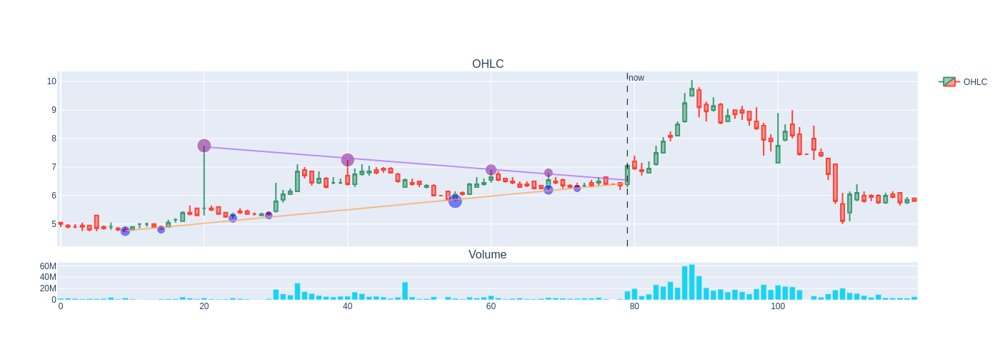

Hit any key for the next plot! 'q' for exit. 


 18%|██████████████████████████████▊                                                                                                                                           | 1266/6980 [00:16<00:57, 99.49it/s]

 best_lower_trend_line:  {'line_x': array([22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79]), 'line_y': array([6.33566718, 6.30415734, 6.2726475 , 6.24113766, 6.20962782,
       6.17811797, 6.14660813, 6.11509829, 6.08358845, 6.05207861,
       6.02056877, 5.98905892, 5.95754908, 5.92603924, 5.8945294 ,
       5.86301956, 5.83150971, 5.79999987, 5.76849003, 5.73698019,
       5.70547035, 5.67396051, 5.64245066, 5.61094082, 5.57943098,
       5.54792114, 5.5164113 , 5.48490145, 5.45339161, 5.42188177,
       5.39037193, 5.35886209, 5.32735225, 5.2958424 , 5.26433256,
       5.23282272, 5.20131288, 5.16980304, 5.13829319, 5.10678335,
       5.07527351, 5.04376367, 5.01225383, 4.98074399, 4.94923414,
       4.9177243 , 4.88621446, 4.85470462, 4.82319478, 4.79168493,
       4.76017509, 4.7

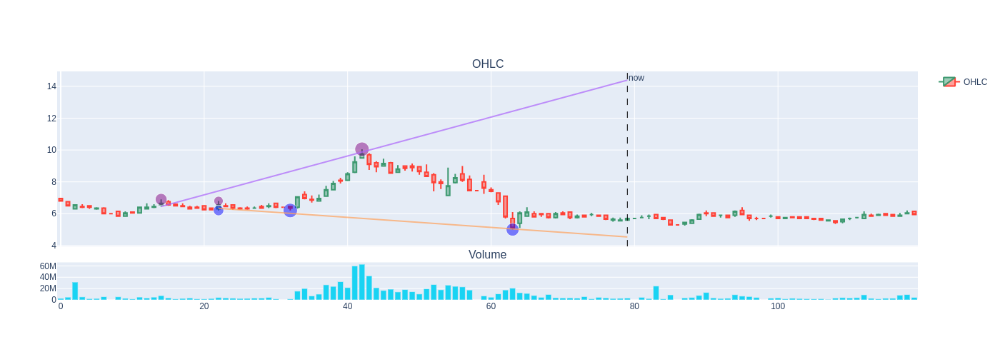

Hit any key for the next plot! 'q' for exit. 


 20%|█████████████████████████████████▎                                                                                                                                       | 1375/6980 [00:16<00:33, 165.26it/s]

 best_lower_trend_line:  {'line_x': array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
       23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
       40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
       57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73,
       74, 75, 76, 77, 78, 79]), 'line_y': array([5.70400944, 5.68015724, 5.65630504, 5.63245284, 5.60860063,
       5.58474843, 5.56089623, 5.53704403, 5.51319183, 5.48933962,
       5.46548742, 5.44163522, 5.41778302, 5.39393082, 5.37007862,
       5.34622641, 5.32237421, 5.29852201, 5.27466981, 5.25081761,
       5.2269654 , 5.2031132 , 5.179261  , 5.1554088 , 5.1315566 ,
       5.10770439, 5.08385219, 5.05999999, 5.03614779, 5.01229559,
       4.98844338, 4.96459118, 4.94073898, 4.91688678, 4.89303458,
       4.86918238, 4.84533017, 4.82147797, 4.79762577, 4.77377357,
       4.74992137, 4.72606916, 4.70221696, 4.67836476, 4.65451256,
       4.63066036,

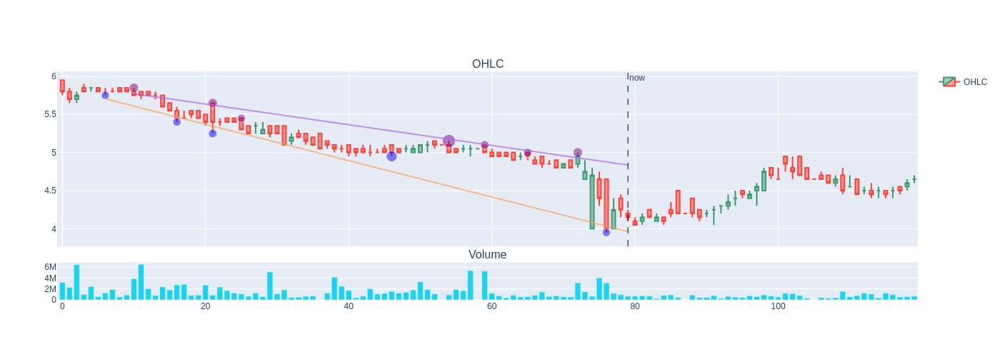

Hit any key for the next plot! 'q' for exit. 


 20%|██████████████████████████████████▏                                                                                                                                      | 1414/6980 [00:16<00:36, 151.08it/s]

 best_lower_trend_line:  {'line_x': array([ 6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
       23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
       40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56,
       57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73,
       74, 75, 76, 77, 78, 79]), 'line_y': array([5.41880213, 5.39736648, 5.37593084, 5.35449519, 5.33305954,
       5.31162389, 5.29018825, 5.2687526 , 5.24731695, 5.22588131,
       5.20444566, 5.18301001, 5.16157436, 5.14013872, 5.11870307,
       5.09726742, 5.07583177, 5.05439613, 5.03296048, 5.01152483,
       4.99008918, 4.96865354, 4.94721789, 4.92578224, 4.9043466 ,
       4.88291095, 4.8614753 , 4.84003965, 4.81860401, 4.79716836,
       4.77573271, 4.75429706, 4.73286142, 4.71142577, 4.68999012,
       4.66855448, 4.64711883, 4.62568318, 4.60424753, 4.58281189,
       4.56137624, 4.53994059, 4.51850494, 4.4970693 , 4.47563365,
       4.454198  ,

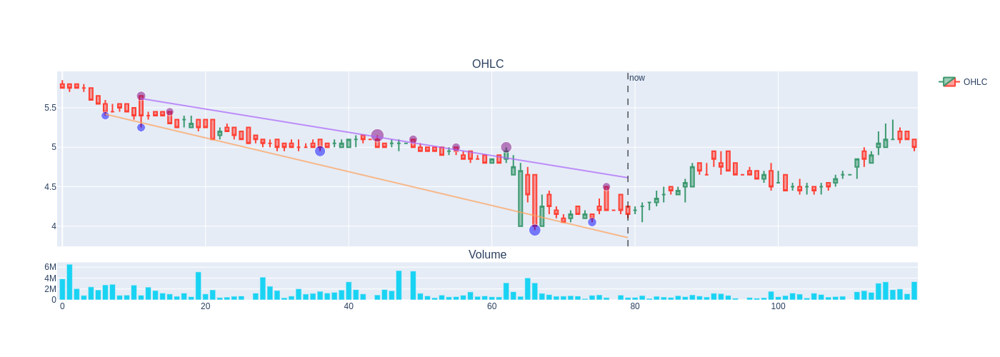

Hit any key for the next plot! 'q' for exit. 


 21%|███████████████████████████████████                                                                                                                                       | 1439/6980 [00:17<01:14, 74.52it/s]

 best_lower_trend_line:  {'line_x': array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([3.92193887, 3.93346949, 3.9450001 , 3.95653071, 3.96806133,
       3.97959194, 3.99112255, 4.00265316, 4.01418378, 4.02571439,
       4.037245  , 4.04877562, 4.06030623, 4.07183684, 4.08336746,
       4.09489807, 4.10642868, 4.11795929, 4.12948991, 4.14102052,
       4.15255113, 4.16408175, 4.17561236, 4.18714297, 4.19867358,
       4.2102042 , 4.22173481, 4.23326542, 4.24479604, 4.25632665,
       4.26785726, 4.27938787, 4.29091849, 4.3024491 , 4.31397971,
       4.32551033, 4.33704094, 4.34857155, 4.36010217, 4.37163278,
       4.38316339, 4.394694  , 4.40622462, 4.41775523, 4.42928584,
       4.44081646, 4.45234707, 4.46387

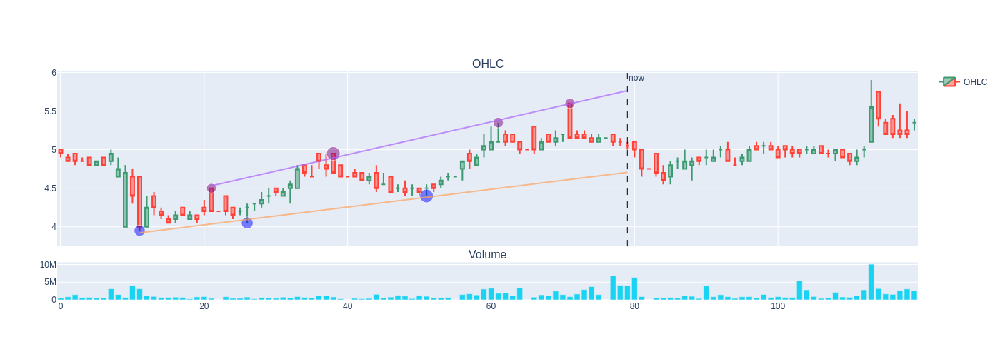

Hit any key for the next plot! 'q' for exit. 


 21%|████████████████████████████████████                                                                                                                                      | 1479/6980 [00:18<01:01, 89.34it/s]

 best_lower_trend_line:  {'line_x': array([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
       26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76,
       77, 78, 79]), 'line_y': array([4.01392835, 4.02567746, 4.03742658, 4.04917569, 4.0609248 ,
       4.07267392, 4.08442303, 4.09617215, 4.10792126, 4.11967037,
       4.13141949, 4.1431686 , 4.15491771, 4.16666683, 4.17841594,
       4.19016505, 4.20191417, 4.21366328, 4.22541239, 4.23716151,
       4.24891062, 4.26065973, 4.27240885, 4.28415796, 4.29590707,
       4.30765619, 4.3194053 , 4.33115441, 4.34290353, 4.35465264,
       4.36640175, 4.37815087, 4.38989998, 4.40164909, 4.41339821,
       4.42514732, 4.43689643, 4.44864555, 4.46039466, 4.47214377,
       4.48389289, 4.495642  , 4.50739111, 4.51914023, 4.53088934,
       4.54263845, 4.55438757,

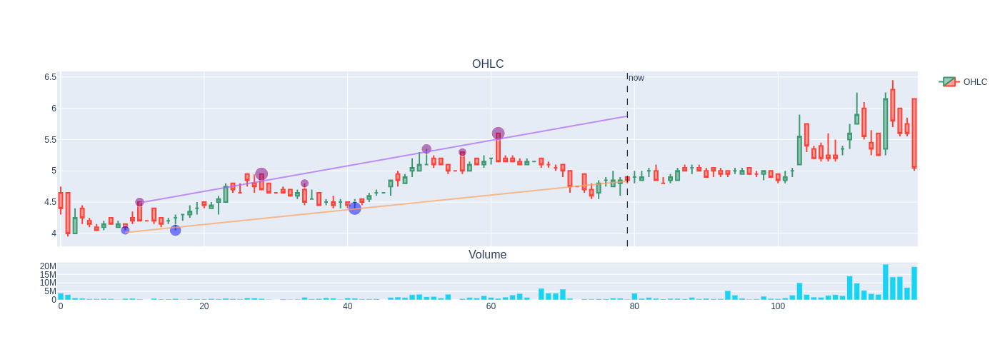

Hit any key for the next plot! 'q' for exit. 


 22%|█████████████████████████████████████▋                                                                                                                                    | 1549/6980 [00:19<01:12, 74.83it/s]

 best_lower_trend_line:  {'line_x': array([15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,
       32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
       49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
       66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([4.81317182, 4.81117874, 4.80918567, 4.80719259, 4.80519952,
       4.80320644, 4.80121337, 4.79922029, 4.79722722, 4.79523414,
       4.79324107, 4.79124799, 4.78925492, 4.78726184, 4.78526877,
       4.78327569, 4.78128262, 4.77928954, 4.77729646, 4.77530339,
       4.77331031, 4.77131724, 4.76932416, 4.76733109, 4.76533801,
       4.76334494, 4.76135186, 4.75935879, 4.75736571, 4.75537264,
       4.75337956, 4.75138649, 4.74939341, 4.74740034, 4.74540726,
       4.74341419, 4.74142111, 4.73942804, 4.73743496, 4.73544189,
       4.73344881, 4.73145574, 4.72946266, 4.72746958, 4.72547651,
       4.72348343, 4.72149036, 4.71949728, 4.71750421, 4.7155

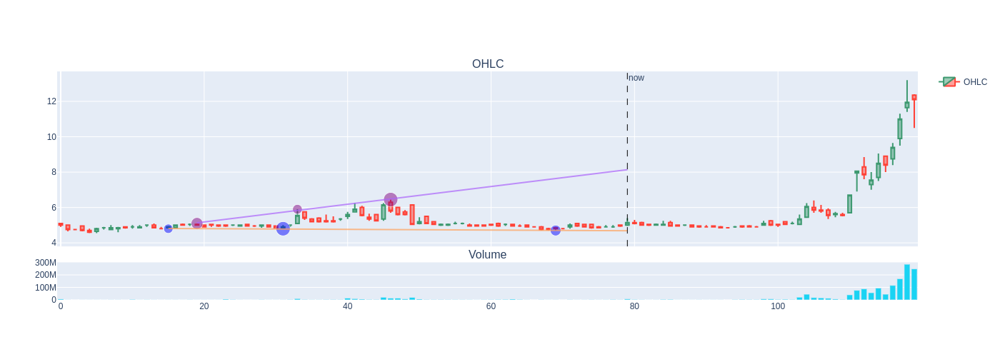

Hit any key for the next plot! 'q' for exit. 


 23%|██████████████████████████████████████▎                                                                                                                                   | 1574/6980 [00:20<01:46, 50.55it/s]

 best_lower_trend_line:  {'line_x': array([24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([4.69834516, 4.70457261, 4.71080005, 4.7170275 , 4.72325494,
       4.72948238, 4.73570983, 4.74193727, 4.74816472, 4.75439216,
       4.76061961, 4.76684705, 4.77307449, 4.77930194, 4.78552938,
       4.79175683, 4.79798427, 4.80421171, 4.81043916, 4.8166666 ,
       4.82289405, 4.82912149, 4.83534894, 4.84157638, 4.84780382,
       4.85403127, 4.86025871, 4.86648616, 4.8727136 , 4.87894105,
       4.88516849, 4.89139593, 4.89762338, 4.90385082, 4.91007827,
       4.91630571, 4.92253315, 4.9287606 , 4.93498804, 4.94121549,
       4.94744293, 4.95367038, 4.95989782, 4.96612526, 4.97235271,
       4.97858015, 4.9848076 , 4.99103504, 4.99726249, 5.00348993,
       5.00971737, 5.01594482,

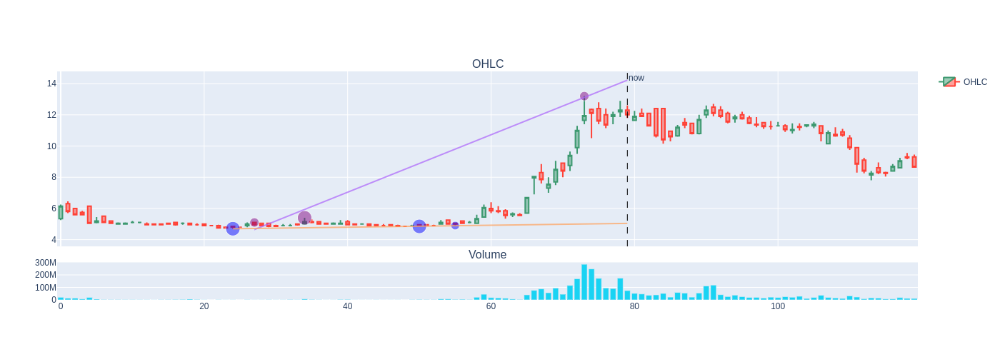

Hit any key for the next plot! 'q' for exit. 


 25%|██████████████████████████████████████████▍                                                                                                                              | 1752/6980 [00:21<00:29, 177.10it/s]

 best_lower_trend_line:  {'line_x': array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,
       53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
       70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([6.47565489, 6.5322415 , 6.58882812, 6.64541474, 6.70200136,
       6.75858797, 6.81517459, 6.87176121, 6.92834783, 6.98493444,
       7.04152106, 7.09810768, 7.1546943 , 7.21128091, 7.26786753,
       7.32445415, 7.38104077, 7.43762738, 7.494214  , 7.55080062,
       7.60738724, 7.66397385, 7.72056047, 7.77714709, 7.83373371,
       7.89032032, 7.94690694, 8.00349356, 8.06008018, 8.11666679,
       8.17325341, 8.22984003, 8.28642665, 8.34301326, 8.39959988,
       8.4561865 , 8.51277312, 8.56935973, 8.62594635, 8.68253297,
       8.73911959, 8.7957062 , 8.85229282, 8.90887944, 8.96546606,
       9.02205267, 9.07863929, 9.13522591, 9.19181253, 9.24839914,
       9.3

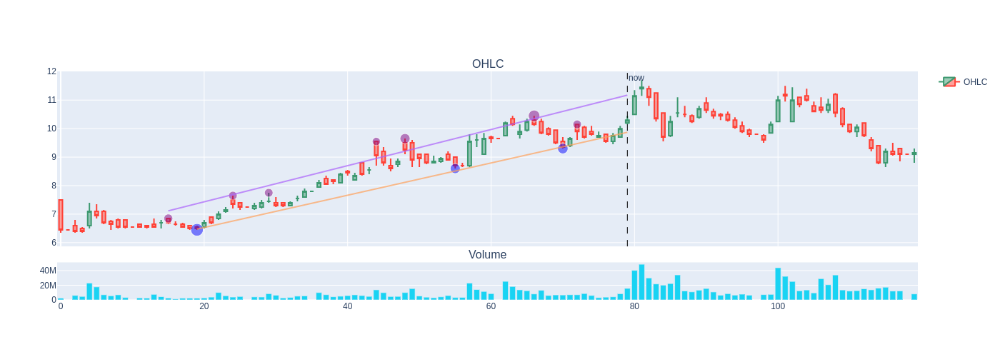

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
       26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76,
       77, 78, 79]), 'line_y': array([ 6.58969236,  6.6392235 ,  6.68875463,  6.73828577,  6.78781691,
        6.83734804,  6.88687918,  6.93641031,  6.98594145,  7.03547259,
        7.08500372,  7.13453486,  7.18406599,  7.23359713,  7.28312827,
        7.3326594 ,  7.38219054,  7.43172167,  7.48125281,  7.53078395,
        7.58031508,  7.62984622,  7.67937735,  7.72890849,  7.77843963,
        7.82797076,  7.8775019 ,  7.92703304,  7.97656417,  8.02609531,
        8.07562644,  8.12515758,  8.17468872,  8.22421985,  8.27375099,
        8.32328212,  8.37281326,  8.4223444 ,  8.47187553,  8.52140667,
        8.5709378 ,  8.62046894,  8.67000008,  8.71953121

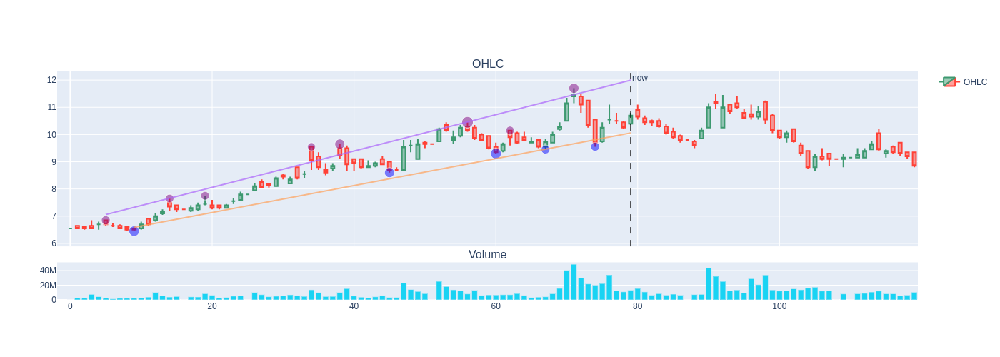

Hit any key for the next plot! 'q' for exit. 


 28%|██████████████████████████████████████████████▌                                                                                                                          | 1923/6980 [00:22<00:31, 159.57it/s]

 best_lower_trend_line:  {'line_x': array([37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([30.73887561, 31.01174477, 31.28461393, 31.55748309, 31.83035226,
       32.10322142, 32.37609058, 32.64895974, 32.9218289 , 33.19469806,
       33.46756722, 33.74043638, 34.01330554, 34.28617471, 34.55904387,
       34.83191303, 35.10478219, 35.37765135, 35.65052051, 35.92338967,
       36.19625883, 36.469128  , 36.74199716, 37.01486632, 37.28773548,
       37.56060464, 37.8334738 , 38.10634296, 38.37921212, 38.65208128,
       38.92495045, 39.19781961, 39.47068877, 39.74355793, 40.01642709,
       40.28929625, 40.56216541, 40.83503457, 41.10790373, 41.3807729 ,
       41.65364206, 41.92651122, 42.19938038]), 'points_x': array([72, 45, 37]), 'points_y': array([40.5       , 32.        , 31.45000076]), 'points_weights': array([ 7,  7, 20])}
bes

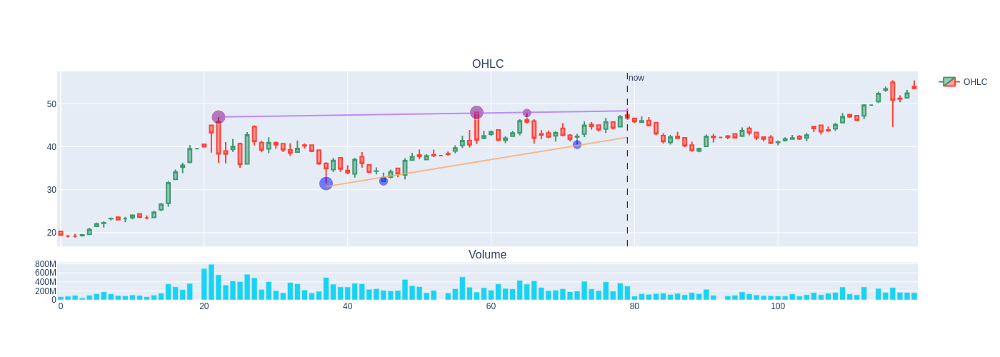

Hit any key for the next plot! 'q' for exit. 


 31%|███████████████████████████████████████████████████▊                                                                                                                     | 2141/6980 [00:24<00:23, 208.97it/s]

 best_lower_trend_line:  {'line_x': array([29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45,
       46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62,
       63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([21.14285687, 21.51198954, 21.88112222, 22.25025489, 22.61938757,
       22.98852024, 23.35765292, 23.72678559, 24.09591827, 24.46505094,
       24.83418362, 25.20331629, 25.57244896, 25.94158164, 26.31071431,
       26.67984699, 27.04897966, 27.41811234, 27.78724501, 28.15637769,
       28.52551036, 28.89464303, 29.26377571, 29.63290838, 30.00204106,
       30.37117373, 30.74030641, 31.10943908, 31.47857176, 31.84770443,
       32.2168371 , 32.58596978, 32.95510245, 33.32423513, 33.6933678 ,
       34.06250048, 34.43163315, 34.80076583, 35.1698985 , 35.53903117,
       35.90816385, 36.27729652, 36.6464292 , 37.01556187, 37.38469455,
       37.75382722, 38.1229599 , 38.49209257, 38.86122524, 39.23035792,
       

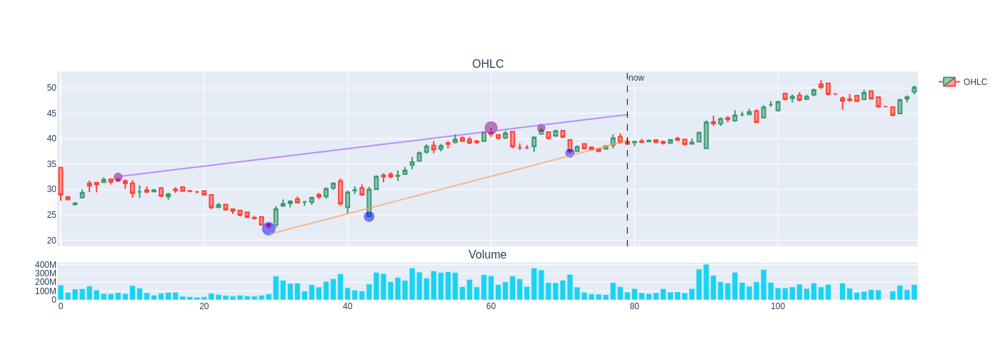

Hit any key for the next plot! 'q' for exit. 


 32%|██████████████████████████████████████████████████████▊                                                                                                                  | 2266/6980 [00:25<00:23, 198.91it/s]

 best_lower_trend_line:  {'line_x': array([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([48.00817802, 48.11004466, 48.21191131, 48.31377795, 48.41564459,
       48.51751123, 48.61937788, 48.72124452, 48.82311116, 48.92497781,
       49.02684445, 49.12871109, 49.23057773, 49.33244438, 49.43431102,
       49.53617766, 49.6380443 , 49.73991095, 49.84177759, 49.94364423,
       50.04551087, 50.14737752, 50.24924416, 50.3511108 , 50.45297745,
       50.55484409, 50.65671073, 50.75857737, 50.86044402, 50.96231066,
       51.0641773 , 51.16604394, 51.26791059, 51.36977723, 51.47164387,
       51.57351051, 51.67537716, 51.7772438 , 51.87911044, 51.98097709,
       52.08284373, 52.18471037, 52.28657701, 52.38844366, 52.4903103 ,
       52.59217694, 52.69404

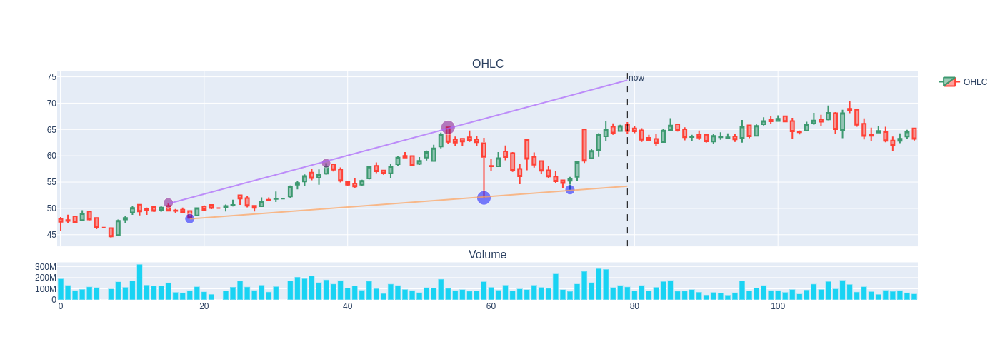

Hit any key for the next plot! 'q' for exit. 


 33%|███████████████████████████████████████████████████████▌                                                                                                                 | 2297/6980 [00:25<00:30, 151.66it/s]

 best_lower_trend_line:  {'line_x': array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
       76, 77, 78, 79]), 'line_y': array([48.23371371, 48.33143357, 48.42915342, 48.52687328, 48.62459314,
       48.72231299, 48.82003285, 48.9177527 , 49.01547256, 49.11319242,
       49.21091227, 49.30863213, 49.40635198, 49.50407184, 49.60179169,
       49.69951155, 49.79723141, 49.89495126, 49.99267112, 50.09039097,
       50.18811083, 50.28583068, 50.38355054, 50.4812704 , 50.57899025,
       50.67671011, 50.77442996, 50.87214982, 50.96986968, 51.06758953,
       51.16530939, 51.26302924, 51.3607491 , 51.45846895, 51.55618881,
       51.65390867, 51.75162852, 51.84934838, 51.94706823, 52.04478809,
       52.14250795, 52.2402278 , 52.33794766, 52.4356

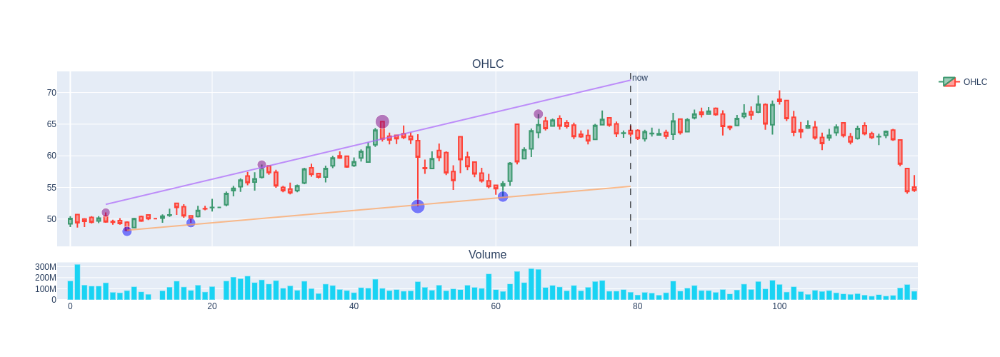

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([49.32886753, 49.42049119, 49.51211485, 49.60373851, 49.69536217,
       49.78698583, 49.87860949, 49.97023315, 50.06185681, 50.15348047,
       50.24510413, 50.33672779, 50.42835145, 50.51997511, 50.61159877,
       50.70322243, 50.79484609, 50.88646975, 50.97809341, 51.06971707,
       51.16134073, 51.25296439, 51.34458805, 51.43621171, 51.52783537,
       51.61945903, 51.71108269, 51.80270635, 51.89433001, 51.98595368,
       52.07757734, 52.169201  , 52.26082466, 52.35244832, 52.44407198,
       52.53569564, 52.6273193 , 52.71894296, 52.81056662, 52.90219028,
       52.99381394, 53.0854376 , 53.17706126, 53.

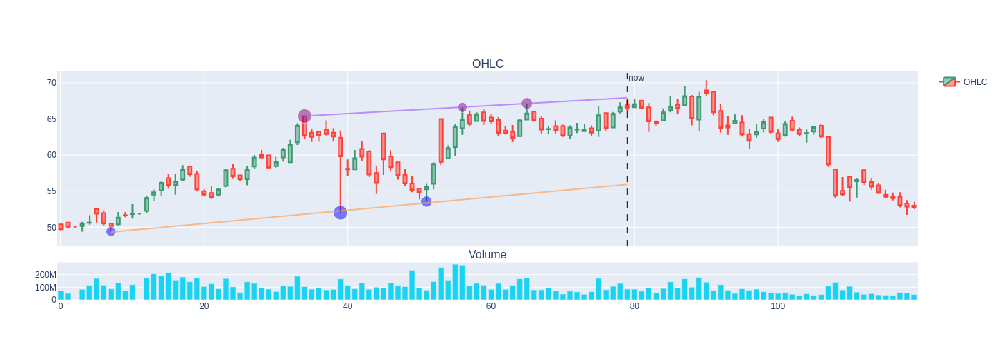

 33%|███████████████████████████████████████████████████████▌                                                                                                                 | 2297/6980 [00:40<00:30, 151.66it/s]

Hit any key for the next plot! 'q' for exit. 


 33%|████████████████████████████████████████████████████████▎                                                                                                                 | 2313/6980 [01:01<25:29,  3.05it/s]

 best_lower_trend_line:  {'line_x': array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([51.84676028, 52.00487217, 52.16298405, 52.32109593, 52.47920782,
       52.6373197 , 52.79543158, 52.95354346, 53.11165535, 53.26976723,
       53.42787911, 53.58599099, 53.74410288, 53.90221476, 54.06032664,
       54.21843853, 54.37655041, 54.53466229, 54.69277417, 54.85088606,
       55.00899794, 55.16710982, 55.3252217 , 55.48333359, 55.64144547,
       55.79955735, 55.95766924, 56.11578112, 56.273893  , 56.43200488,
       56.59011677, 56.74822865, 56.90634053, 57.06445242, 57.2225643 ,
       57.38067618, 57.53878806, 57.69689995, 57.85501183, 58.01312371,
       58.17123559, 58.32934748, 58.48745936, 58.64557124, 58.80368313,
       58.96

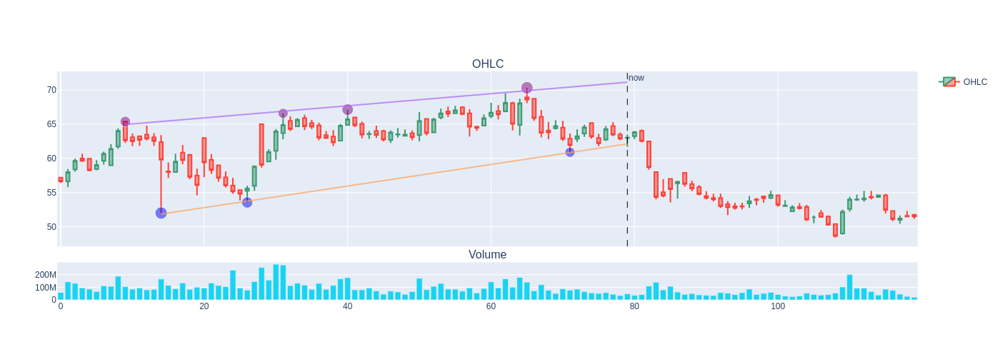

Hit any key for the next plot! 'q' for exit. 


 34%|█████████████████████████████████████████████████████████▉                                                                                                                | 2381/6980 [01:03<12:44,  6.01it/s]

 best_lower_trend_line:  {'line_x': array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([63.61833097, 63.30560499, 62.99287901, 62.68015304, 62.36742706,
       62.05470108, 61.74197511, 61.42924913, 61.11652315, 60.80379718,
       60.4910712 , 60.17834522, 59.86561925, 59.55289327, 59.24016729,
       58.92744131, 58.61471534, 58.30198936, 57.98926338, 57.67653741,
       57.36381143, 57.05108545, 56.73835948, 56.4256335 , 56.11290752,
       55.80018154, 55.48745557, 55.17472959, 54.86200361, 54.54927764,
       54.23655166, 53.92382568, 53.61109971, 53.29837373, 52.98564775,
       52.67292177, 52.3601958 , 52.04746982, 51.73474384, 51.42201787,
       51.10929189, 50.79656591, 50.48383994, 50.17111396, 49.858

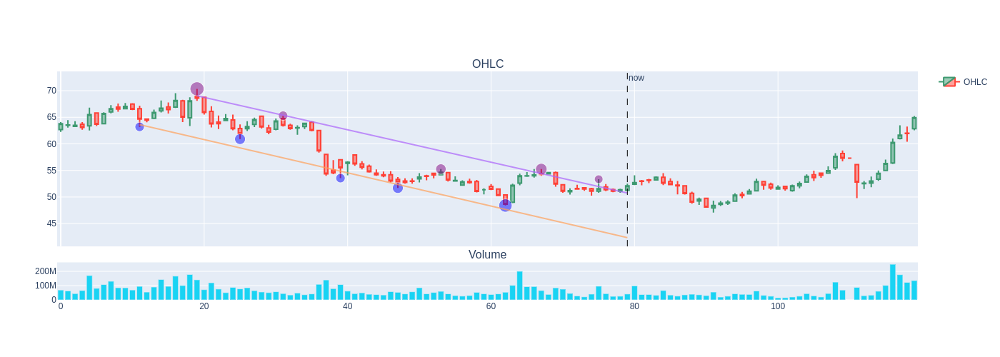

Hit any key for the next plot! 'q' for exit. 


 37%|██████████████████████████████████████████████████████████████▌                                                                                                           | 2567/6980 [01:04<02:25, 30.31it/s]

 best_lower_trend_line:  {'line_x': array([10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26,
       27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60,
       61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79]), 'line_y': array([48.50902437, 48.95758038, 49.40613639, 49.8546924 , 50.30324841,
       50.75180442, 51.20036043, 51.64891643, 52.09747244, 52.54602845,
       52.99458446, 53.44314047, 53.89169648, 54.34025249, 54.7888085 ,
       55.23736451, 55.68592052, 56.13447652, 56.58303253, 57.03158854,
       57.48014455, 57.92870056, 58.37725657, 58.82581258, 59.27436859,
       59.7229246 , 60.17148061, 60.62003661, 61.06859262, 61.51714863,
       61.96570464, 62.41426065, 62.86281666, 63.31137267, 63.75992868,
       64.20848469, 64.6570407 , 65.1055967 , 65.55415271, 66.00270872,
       66.45126473, 66.89982074, 67.34837675, 67.79693276, 68

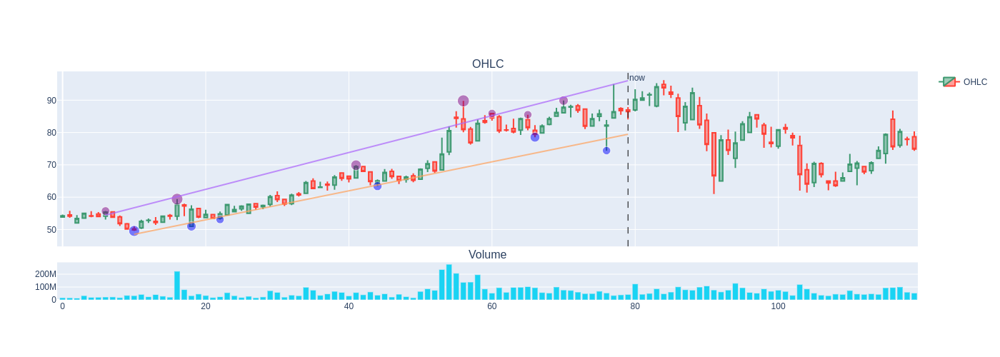

Hit any key for the next plot! 'q' for exit. 


 37%|███████████████████████████████████████████████████████████████▌                                                                                                          | 2609/6980 [01:05<02:10, 33.56it/s]

 best_lower_trend_line:  {'line_x': array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
       76, 77, 78, 79]), 'line_y': array([51.84799041, 52.28677504, 52.72555966, 53.16434429, 53.60312891,
       54.04191354, 54.48069816, 54.91948279, 55.35826742, 55.79705204,
       56.23583667, 56.67462129, 57.11340592, 57.55219054, 57.99097517,
       58.4297598 , 58.86854442, 59.30732905, 59.74611367, 60.1848983 ,
       60.62368292, 61.06246755, 61.50125218, 61.9400368 , 62.37882143,
       62.81760605, 63.25639068, 63.6951753 , 64.13395993, 64.57274456,
       65.01152918, 65.45031381, 65.88909843, 66.32788306, 66.76666768,
       67.20545231, 67.64423694, 68.08302156, 68.52180619, 68.96059081,
       69.39937544, 69.83816006, 70.27694469, 70.7157

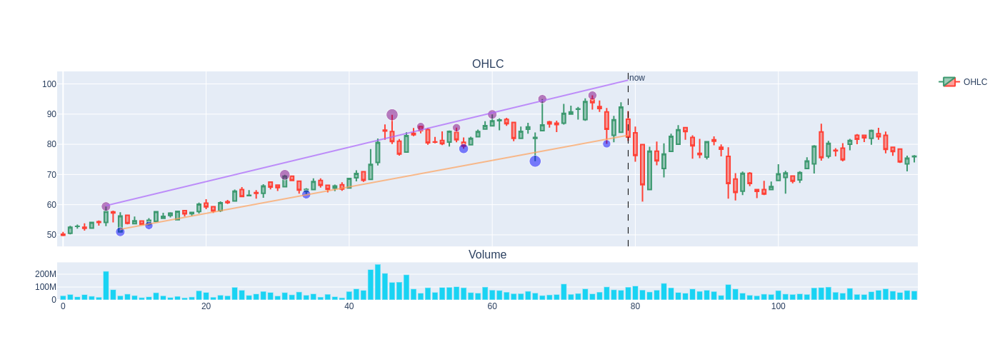

Hit any key for the next plot! 'q' for exit. 


 38%|████████████████████████████████████████████████████████████████▎                                                                                                         | 2640/6980 [01:05<01:58, 36.64it/s]

 best_lower_trend_line:  {'line_x': array([24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([60.76062788, 60.84111266, 60.92159744, 61.00208222, 61.08256699,
       61.16305177, 61.24353655, 61.32402133, 61.4045061 , 61.48499088,
       61.56547566, 61.64596044, 61.72644522, 61.80692999, 61.88741477,
       61.96789955, 62.04838433, 62.12886911, 62.20935388, 62.28983866,
       62.37032344, 62.45080822, 62.531293  , 62.61177777, 62.69226255,
       62.77274733, 62.85323211, 62.93371688, 63.01420166, 63.09468644,
       63.17517122, 63.255656  , 63.33614077, 63.41662555, 63.49711033,
       63.57759511, 63.65807989, 63.73856466, 63.81904944, 63.89953422,
       63.980019  , 64.06050378, 64.14098855, 64.22147333, 64.30195811,
       64.38244289, 64.46292766, 64.54341244, 64.623

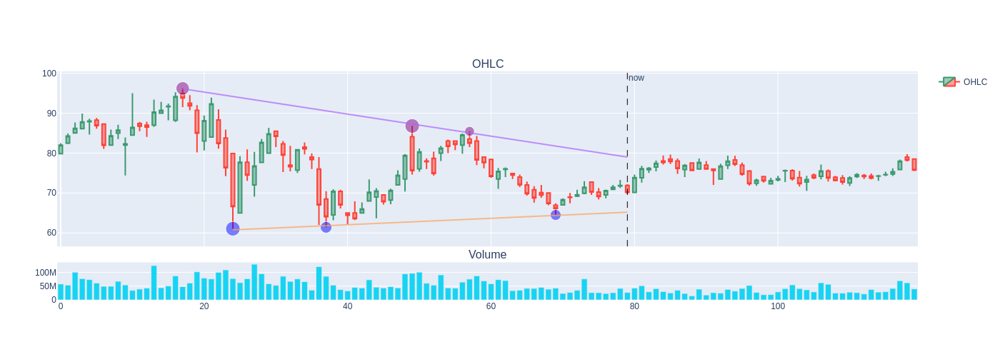

Hit any key for the next plot! 'q' for exit. 


 38%|████████████████████████████████████████████████████████████████▉                                                                                                         | 2668/6980 [01:06<01:51, 38.72it/s]

 best_lower_trend_line:  {'line_x': array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([60.76062788, 60.84111266, 60.92159744, 61.00208222, 61.08256699,
       61.16305177, 61.24353655, 61.32402133, 61.4045061 , 61.48499088,
       61.56547566, 61.64596044, 61.72644522, 61.80692999, 61.88741477,
       61.96789955, 62.04838433, 62.12886911, 62.20935388, 62.28983866,
       62.37032344, 62.45080822, 62.531293  , 62.61177777, 62.69226255,
       62.77274733, 62.85323211, 62.93371688, 63.01420166, 63.09468644,
       63.17517122, 63.255656  , 63.33614077, 63.41662555, 63.49711033,
       63.57759511, 63.65807989, 63.73856466, 63.81904944, 63.89953422,
       63.980019  , 64.06050378, 64.14098855, 64.22147333, 64.301

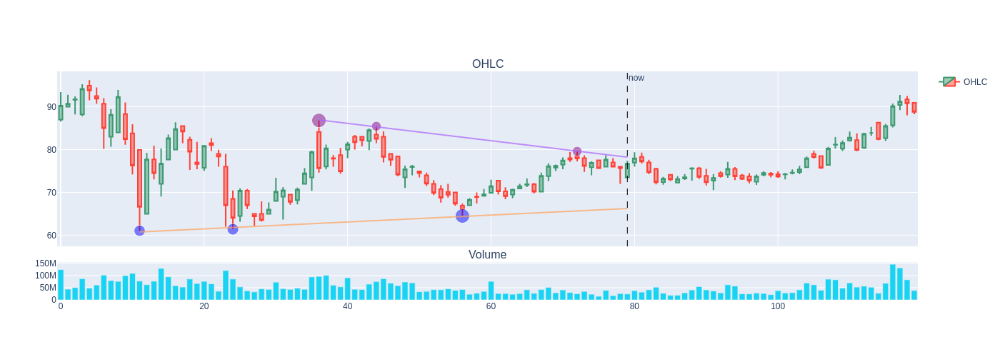

Hit any key for the next plot! 'q' for exit. 


 38%|█████████████████████████████████████████████████████████████████▍                                                                                                        | 2686/6980 [01:06<01:54, 37.42it/s]

 best_lower_trend_line:  {'line_x': array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([60.55834552, 60.74647307, 60.93460062, 61.12272817, 61.31085573,
       61.49898328, 61.68711083, 61.87523838, 62.06336593, 62.25149348,
       62.43962103, 62.62774859, 62.81587614, 63.00400369, 63.19213124,
       63.38025879, 63.56838634, 63.75651389, 63.94464144, 64.132769  ,
       64.32089655, 64.5090241 , 64.69715165, 64.8852792 , 65.07340675,
       65.2615343 , 65.44966186, 65.63778941, 65.82591696, 66.01404451,
       66.20217206, 66.39029961, 66.57842716, 66.76655471, 66.95468227,
       67.14280982, 67.33093737, 67.51906492, 67.70719247, 67.89532002,
       68.08344757, 68.27157513, 68.45970268, 68.64783023, 68.83595778,
       69.02

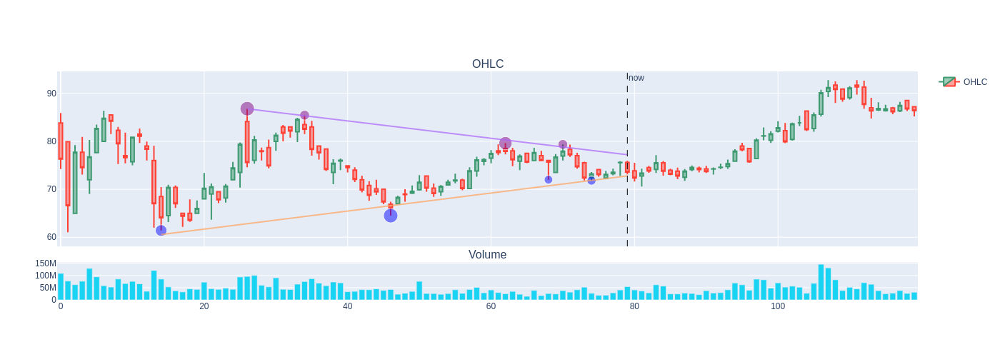

Hit any key for the next plot! 'q' for exit. 


 39%|█████████████████████████████████████████████████████████████████▊                                                                                                        | 2700/6980 [01:07<02:08, 33.22it/s]

 best_lower_trend_line:  {'line_x': array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
       38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([60.8580349 , 61.01412212, 61.17020934, 61.32629656, 61.48238378,
       61.638471  , 61.79455822, 61.95064544, 62.10673266, 62.26281989,
       62.41890711, 62.57499433, 62.73108155, 62.88716877, 63.04325599,
       63.19934321, 63.35543043, 63.51151765, 63.66760487, 63.82369209,
       63.97977931, 64.13586653, 64.29195375, 64.44804097, 64.60412819,
       64.76021541, 64.91630263, 65.07238985, 65.22847707, 65.38456429,
       65.54065151, 65.69673873, 65.85282595, 66.00891317, 66.16500039,
       66.32108761, 66.47717483, 66.63326205, 66.78934927, 66.94543649,
       67.10152371, 67.25761093, 67.4

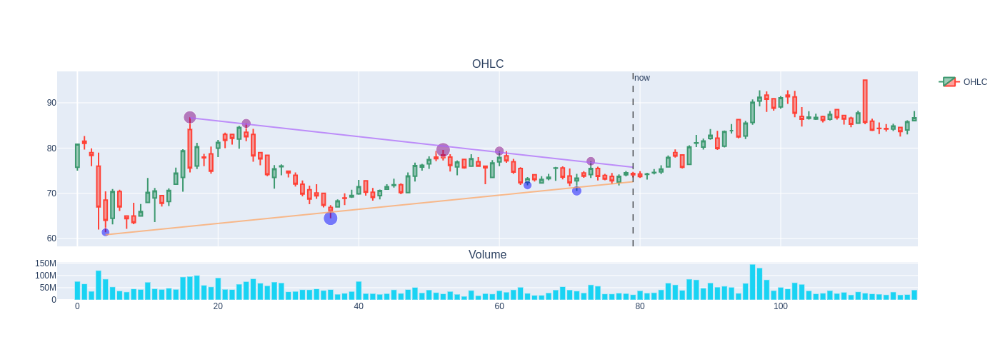

Hit any key for the next plot! 'q' for exit. 


 40%|████████████████████████████████████████████████████████████████████▏                                                                                                     | 2801/6980 [01:08<00:51, 81.15it/s]

 best_lower_trend_line:  {'line_x': array([18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([78.62573408, 78.86126642, 79.09679876, 79.3323311 , 79.56786345,
       79.80339579, 80.03892813, 80.27446047, 80.50999281, 80.74552515,
       80.98105749, 81.21658983, 81.45212218, 81.68765452, 81.92318686,
       82.1587192 , 82.39425154, 82.62978388, 82.86531622, 83.10084857,
       83.33638091, 83.57191325, 83.80744559, 84.04297793, 84.27851027,
       84.51404261, 84.74957495, 84.9851073 , 85.22063964, 85.45617198,
       85.69170432, 85.92723666, 86.162769  , 86.39830134, 86.63383369,
       86.86936603, 87.10489837, 87.34043071, 87.57596305, 87.81149539,
       88.04702773, 88.28256007, 88.51809242, 88.75362476, 88.9891571 ,
       89.22468944, 89.46022

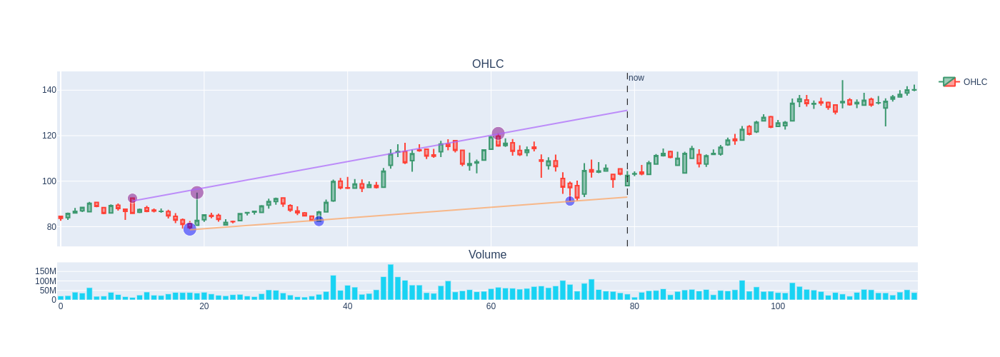

Hit any key for the next plot! 'q' for exit. 


 43%|████████████████████████████████████████████████████████████████████████                                                                                                 | 2975/6980 [01:09<00:18, 212.36it/s]

 best_lower_trend_line:  {'line_x': array([ 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25,
       26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42,
       43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59,
       60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76,
       77, 78, 79]), 'line_y': array([124.67880069, 126.2603753 , 127.84194991, 129.42352453,
       131.00509914, 132.58667375, 134.16824836, 135.74982298,
       137.33139759, 138.9129722 , 140.49454681, 142.07612142,
       143.65769604, 145.23927065, 146.82084526, 148.40241987,
       149.98399449, 151.5655691 , 153.14714371, 154.72871832,
       156.31029293, 157.89186755, 159.47344216, 161.05501677,
       162.63659138, 164.218166  , 165.79974061, 167.38131522,
       168.96288983, 170.54446444, 172.12603906, 173.70761367,
       175.28918828, 176.87076289, 178.4523375 , 180.03391212,
       181.61548673, 183.19706134, 184.77863595, 186.36021057,
   

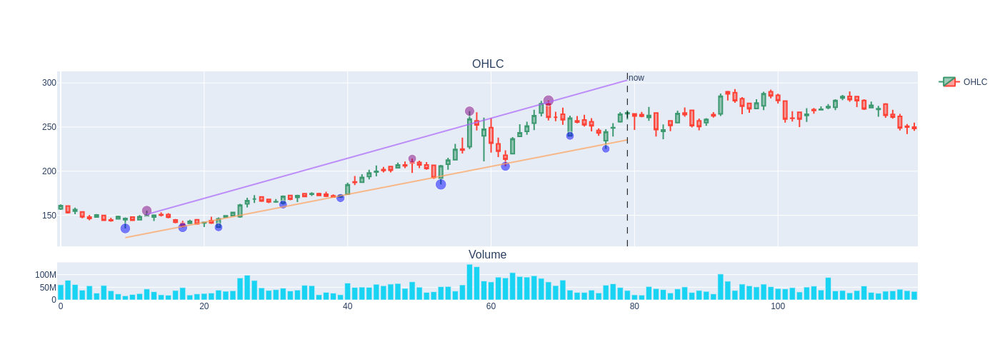

Hit any key for the next plot! 'q' for exit. 


 45%|███████████████████████████████████████████████████████████████████████████▉                                                                                             | 3137/6980 [01:10<00:18, 203.88it/s]

 best_lower_trend_line:  {'line_x': array([27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43,
       44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60,
       61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77,
       78, 79]), 'line_y': array([159.78333791, 158.88070625, 157.97807459, 157.07544293,
       156.17281127, 155.27017961, 154.36754796, 153.4649163 ,
       152.56228464, 151.65965298, 150.75702132, 149.85438966,
       148.951758  , 148.04912634, 147.14649468, 146.24386302,
       145.34123136, 144.4385997 , 143.53596804, 142.63333639,
       141.73070473, 140.82807307, 139.92544141, 139.02280975,
       138.12017809, 137.21754643, 136.31491477, 135.41228311,
       134.50965145, 133.60701979, 132.70438813, 131.80175647,
       130.89912481, 129.99649316, 129.0938615 , 128.19122984,
       127.28859818, 126.38596652, 125.48333486, 124.5807032 ,
       123.67807154, 122.77543988, 121.87280822, 120.97017656,
       120.0675449 

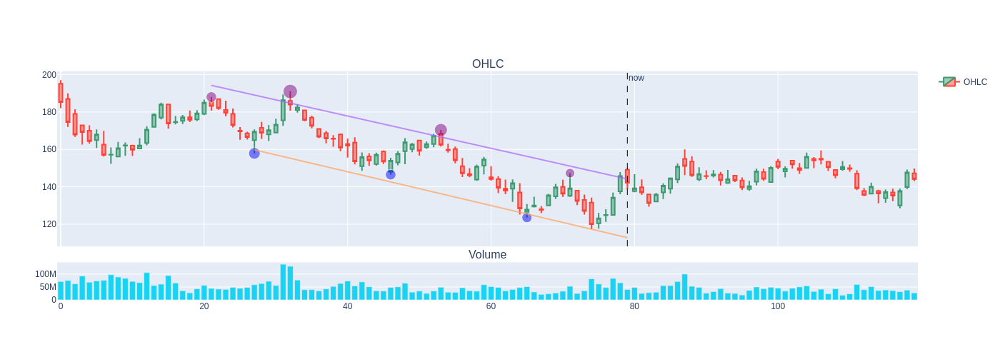

Hit any key for the next plot! 'q' for exit. 


 55%|████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 3814/6980 [01:12<00:06, 503.75it/s]

 best_lower_trend_line:  {'line_x': array([32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
       49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
       66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([164.93333944, 163.97976757, 163.02619571, 162.07262384,
       161.11905198, 160.16548011, 159.21190825, 158.25833639,
       157.30476452, 156.35119266, 155.39762079, 154.44404893,
       153.49047706, 152.5369052 , 151.58333333, 150.62976147,
       149.6761896 , 148.72261774, 147.76904588, 146.81547401,
       145.86190215, 144.90833028, 143.95475842, 143.00118655,
       142.04761469, 141.09404282, 140.14047096, 139.18689909,
       138.23332723, 137.27975537, 136.3261835 , 135.37261164,
       134.41903977, 133.46546791, 132.51189604, 131.55832418,
       130.60475231, 129.65118045, 128.69760858, 127.74403672,
       126.79046486, 125.83689299, 124.88332113, 123.92974926,
       122.9761774 , 122.02260553, 121.0690336

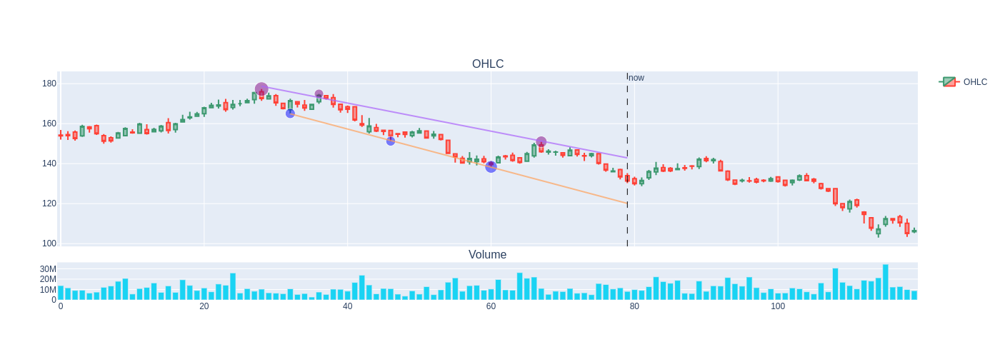

Hit any key for the next plot! 'q' for exit. 


 56%|██████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 3919/6980 [01:13<00:15, 200.36it/s]

 best_lower_trend_line:  {'line_x': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([139.32399034, 138.71338067, 138.10277099, 137.49216131,
       136.88155164, 136.27094196, 135.66033228, 135.04972261,
       134.43911293, 133.82850325, 133.21789358, 132.6072839 ,
       131.99667422, 131.38606455, 130.77545487, 130.16484519,
       129.55423552, 128.94362584, 128.33301616, 127.72240648,
       127.11179681, 126.50118713, 125.89057745, 125.27996778,
       124.6693581 , 124.05874842, 123.44813875, 122.83752907,
       122.22691939, 121.61630972, 121.00570004, 120.39509036,
       119.78448069, 119.17387101, 118.56326133, 117.95265166,
       117.34204198, 116.7314323 , 116.12082263, 115.51021

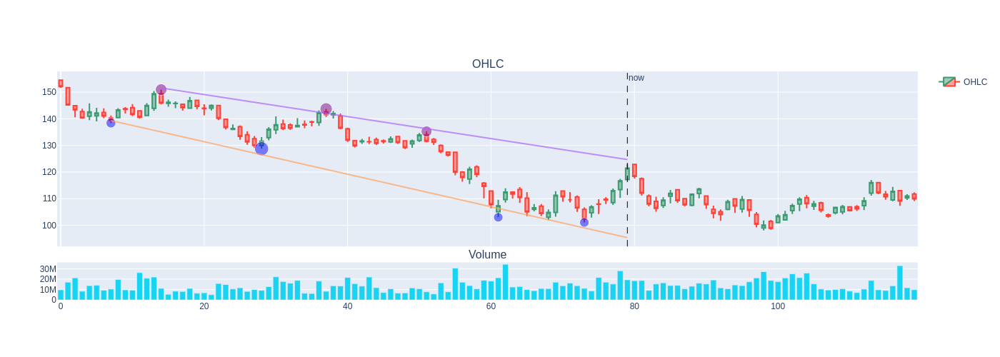

Hit any key for the next plot! 'q' for exit. 


 60%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                                    | 4174/6980 [01:14<00:09, 291.18it/s]

 best_lower_trend_line:  {'line_x': array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24,
       25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41,
       42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58,
       59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75,
       76, 77, 78, 79]), 'line_y': array([87.14834111, 86.91319994, 86.67805876, 86.44291759, 86.20777641,
       85.97263524, 85.73749407, 85.50235289, 85.26721172, 85.03207055,
       84.79692937, 84.5617882 , 84.32664703, 84.09150585, 83.85636468,
       83.6212235 , 83.38608233, 83.15094116, 82.91579998, 82.68065881,
       82.44551764, 82.21037646, 81.97523529, 81.74009412, 81.50495294,
       81.26981177, 81.03467059, 80.79952942, 80.56438825, 80.32924707,
       80.0941059 , 79.85896473, 79.62382355, 79.38868238, 79.15354121,
       78.91840003, 78.68325886, 78.44811769, 78.21297651, 77.97783534,
       77.74269416, 77.50755299, 77.27241182, 77.0372

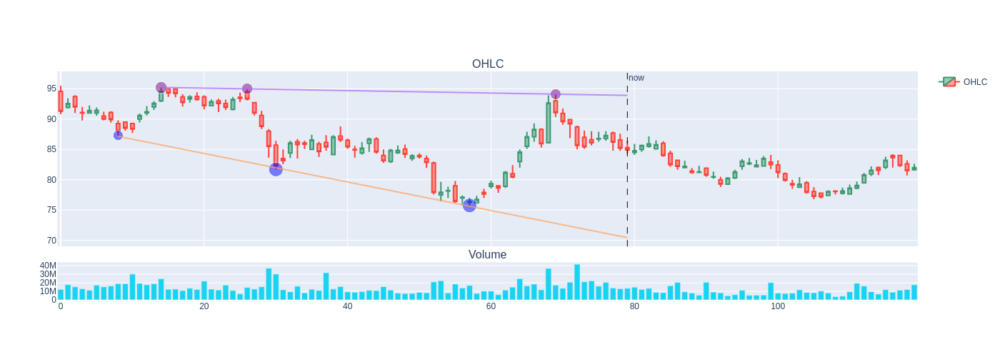

Hit any key for the next plot! 'q' for exit. 


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                | 4335/6980 [01:15<00:11, 237.36it/s]

 best_lower_trend_line:  {'line_x': array([22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79]), 'line_y': array([67.21554297, 66.81334697, 66.41115096, 66.00895495, 65.60675894,
       65.20456293, 64.80236693, 64.40017092, 63.99797491, 63.5957789 ,
       63.1935829 , 62.79138689, 62.38919088, 61.98699487, 61.58479886,
       61.18260286, 60.78040685, 60.37821084, 59.97601483, 59.57381883,
       59.17162282, 58.76942681, 58.3672308 , 57.96503479, 57.56283879,
       57.16064278, 56.75844677, 56.35625076, 55.95405476, 55.55185875,
       55.14966274, 54.74746673, 54.34527072, 53.94307472, 53.54087871,
       53.1386827 , 52.73648669, 52.33429068, 51.93209468, 51.52989867,
       51.12770266, 50.72550665, 50.32331065, 49.92111464, 49.51891863,
       49.11672262, 48.71452661, 48.31233061

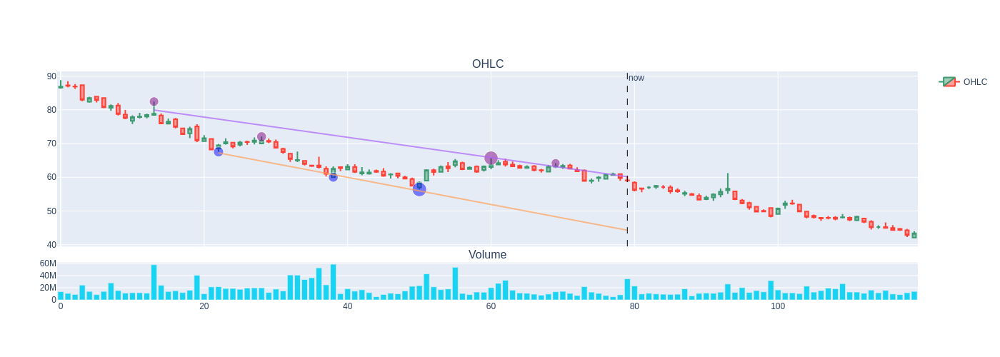

Hit any key for the next plot! 'q' for exit. 


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 4381/6980 [01:16<00:19, 136.19it/s]

 best_lower_trend_line:  {'line_x': array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([61.42754571, 61.03003341, 60.6325211 , 60.2350088 , 59.8374965 ,
       59.4399842 , 59.04247189, 58.64495959, 58.24744729, 57.84993499,
       57.45242268, 57.05491038, 56.65739808, 56.25988578, 55.86237348,
       55.46486117, 55.06734887, 54.66983657, 54.27232427, 53.87481196,
       53.47729966, 53.07978736, 52.68227506, 52.28476276, 51.88725045,
       51.48973815, 51.09222585, 50.69471355, 50.29720124, 49.89968894,
       49.50217664, 49.10466434, 48.70715204, 48.30963973, 47.91212743,
       47.51461513, 47.11710283, 46.71959052, 46.32207822, 45.92456592,
       45.52705362, 45.12954132, 44.73202901, 44.33451671, 43.937

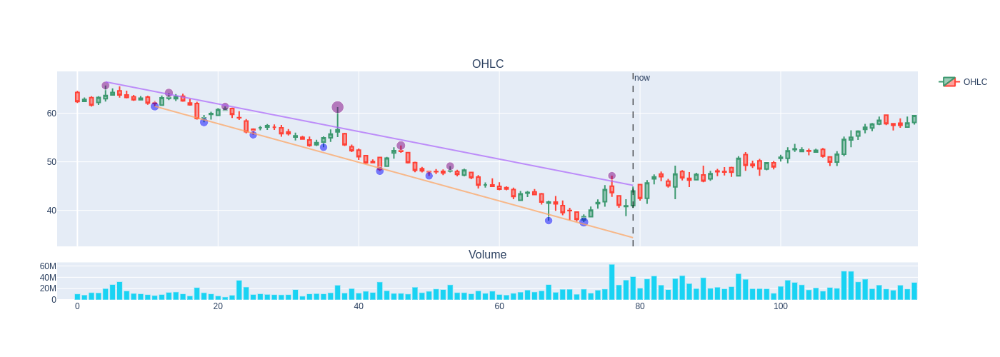

Hit any key for the next plot! 'q' for exit. 


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 4415/6980 [01:16<00:29, 86.56it/s]

 best_lower_trend_line:  {'line_x': array([22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79]), 'line_y': array([36.66922081, 36.98193199, 37.29464316, 37.60735434, 37.92006552,
       38.2327767 , 38.54548787, 38.85819905, 39.17091023, 39.4836214 ,
       39.79633258, 40.10904376, 40.42175494, 40.73446611, 41.04717729,
       41.35988847, 41.67259965, 41.98531082, 42.298022  , 42.61073318,
       42.92344436, 43.23615553, 43.54886671, 43.86157789, 44.17428907,
       44.48700024, 44.79971142, 45.1124226 , 45.42513377, 45.73784495,
       46.05055613, 46.36326731, 46.67597848, 46.98868966, 47.30140084,
       47.61411202, 47.92682319, 48.23953437, 48.55224555, 48.86495673,
       49.1776679 , 49.49037908, 49.80309026, 50.11580144, 50.42851261,
       50.74122379, 51.05393497, 51.36664614

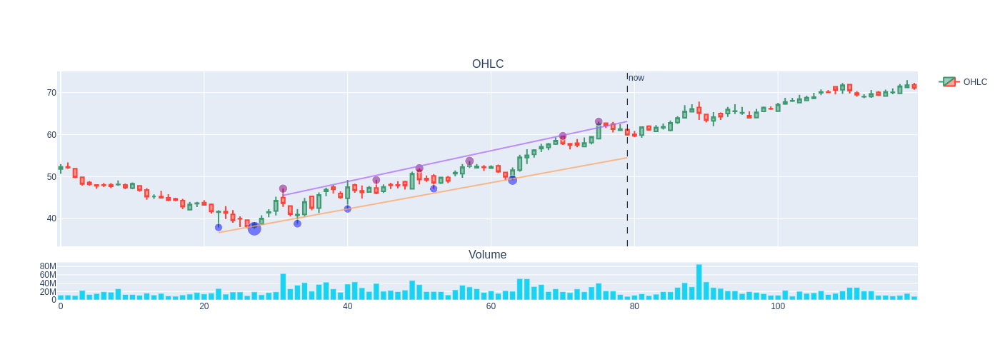

Hit any key for the next plot! 'q' for exit. 


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                             | 4449/6980 [01:17<00:37, 68.04it/s]

 best_lower_trend_line:  {'line_x': array([12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28,
       29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45,
       46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62,
       63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([35.78895246, 36.1701788 , 36.55140514, 36.93263147, 37.31385781,
       37.69508415, 38.07631049, 38.45753683, 38.83876317, 39.2199895 ,
       39.60121584, 39.98244218, 40.36366852, 40.74489486, 41.1261212 ,
       41.50734753, 41.88857387, 42.26980021, 42.65102655, 43.03225289,
       43.41347923, 43.79470556, 44.1759319 , 44.55715824, 44.93838458,
       45.31961092, 45.70083726, 46.08206359, 46.46328993, 46.84451627,
       47.22574261, 47.60696895, 47.98819529, 48.36942162, 48.75064796,
       49.1318743 , 49.51310064, 49.89432698, 50.27555332, 50.65677965,
       51.03800599, 51.41923233, 51.80045867, 52.18168501, 52.56291135,
    

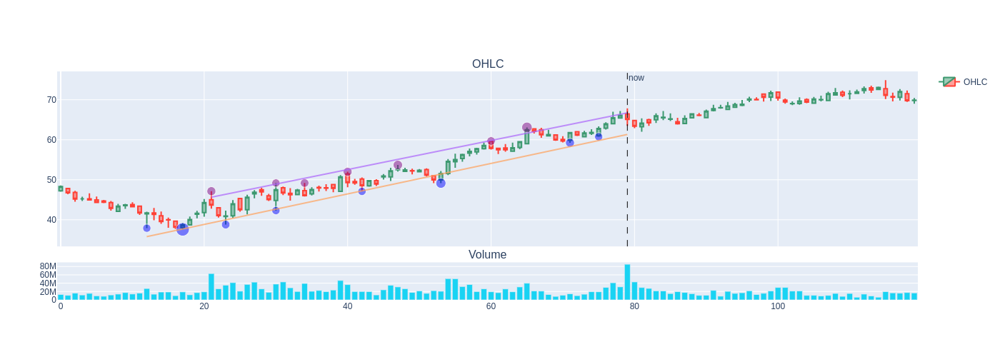

Hit any key for the next plot! 'q' for exit. 


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 4468/6980 [01:18<00:51, 48.59it/s]

 best_lower_trend_line:  {'line_x': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23,
       24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40,
       41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57,
       58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74,
       75, 76, 77, 78, 79]), 'line_y': array([36.92085563, 37.31612423, 37.71139283, 38.10666143, 38.50193003,
       38.89719863, 39.29246724, 39.68773584, 40.08300444, 40.47827304,
       40.87354164, 41.26881024, 41.66407885, 42.05934745, 42.45461605,
       42.84988465, 43.24515325, 43.64042185, 44.03569046, 44.43095906,
       44.82622766, 45.22149626, 45.61676486, 46.01203346, 46.40730207,
       46.80257067, 47.19783927, 47.59310787, 47.98837647, 48.38364508,
       48.77891368, 49.17418228, 49.56945088, 49.96471948, 50.35998808,
       50.75525669, 51.15052529, 51.54579389, 51.94106249, 52.33633109,
       52.73159969, 53.1268683 , 53.5221369 , 53.

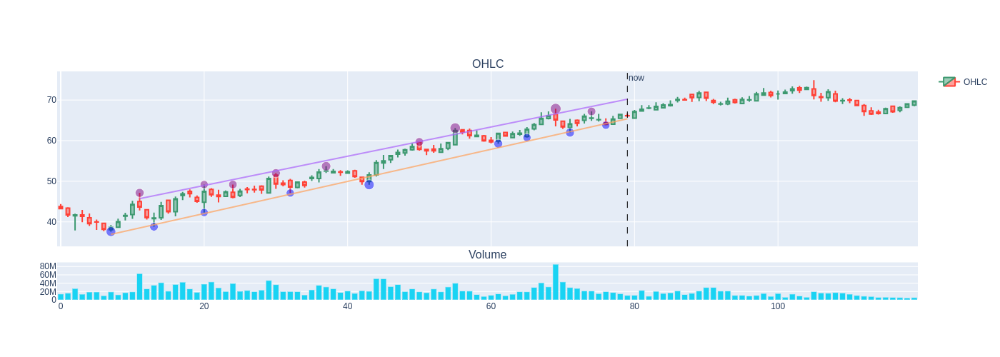

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([38.97226912, 39.37433355, 39.77639797, 40.17846239, 40.58052681,
       40.98259123, 41.38465565, 41.78672007, 42.1887845 , 42.59084892,
       42.99291334, 43.39497776, 43.79704218, 44.1991066 , 44.60117102,
       45.00323544, 45.40529987, 45.80736429, 46.20942871, 46.61149313,
       47.01355755, 47.41562197, 47.81768639, 48.21975082, 48.62181524,
       49.02387966, 49.42594408, 49.8280085 , 50.23007292, 50.63213734,
       51.03420177, 51.43626619, 51.83833061, 52.24039503, 52.64245945,
       53.04452387, 53.44658829, 53.84865271, 54.25071714, 54.65278156,
       55.05484598, 55.4569104 , 

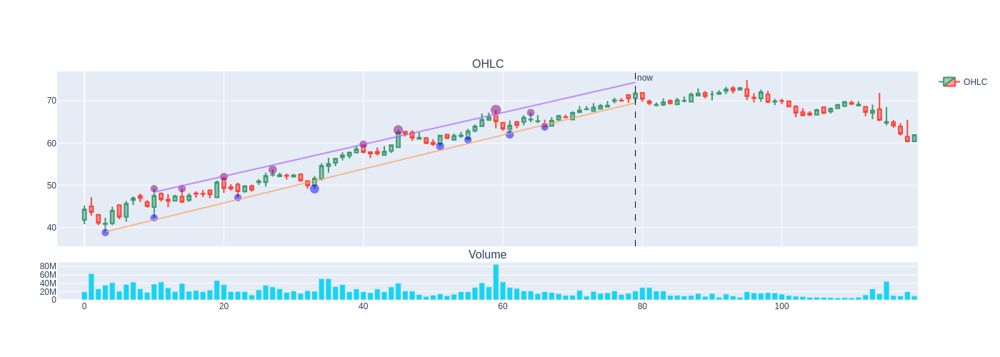

Hit any key for the next plot! 'q' for exit. 


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 4537/6980 [01:20<00:54, 44.55it/s]

 best_lower_trend_line:  {'line_x': array([13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
       30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,
       64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([69.94973124, 69.664556  , 69.37938077, 69.09420554, 68.80903031,
       68.52385508, 68.23867985, 67.95350462, 67.66832939, 67.38315416,
       67.09797893, 66.8128037 , 66.52762846, 66.24245323, 65.957278  ,
       65.67210277, 65.38692754, 65.10175231, 64.81657708, 64.53140185,
       64.24622662, 63.96105139, 63.67587615, 63.39070092, 63.10552569,
       62.82035046, 62.53517523, 62.25      , 61.96482477, 61.67964954,
       61.39447431, 61.10929908, 60.82412385, 60.53894861, 60.25377338,
       59.96859815, 59.68342292, 59.39824769, 59.11307246, 58.82789723,
       58.542722  , 58.25754677, 57.97237154, 57.6871963 , 57.40202107,
       5

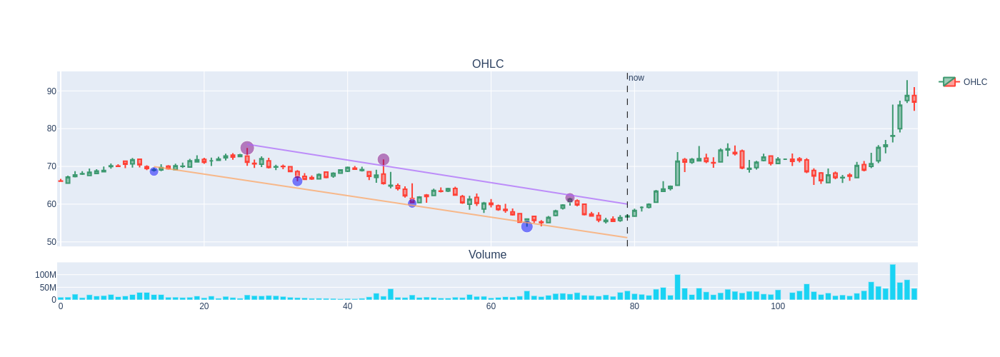

Hit any key for the next plot! 'q' for exit. 


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 4755/6980 [01:22<00:13, 159.61it/s]

 best_lower_trend_line:  {'line_x': array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([75.22140058, 74.9411425 , 74.66088443, 74.38062636, 74.10036828,
       73.82011021, 73.53985213, 73.25959406, 72.97933598, 72.69907791,
       72.41881983, 72.13856176, 71.85830368, 71.57804561, 71.29778753,
       71.01752946, 70.73727138, 70.45701331, 70.17675523, 69.89649716,
       69.61623909, 69.33598101, 69.05572294, 68.77546486, 68.49520679,
       68.21494871, 67.93469064, 67.65443256, 67.37417449, 67.09391641,
       66.81365834, 66.53340026, 66.25314219, 65.97288411, 65.69262604,
       65.41236796, 65.13210989, 64.85185182, 64.57159374, 64.29133567,
       64.01107759, 63.73081952, 63.45056144, 63.17030337, 62.89004529,
       62.60978722, 62.32952914, 62.04927107, 61.76901299, 61.488754

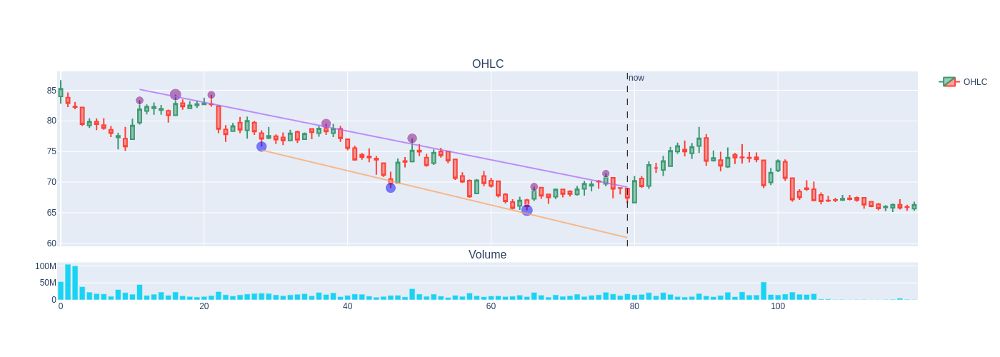

Hit any key for the next plot! 'q' for exit. 


 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 4903/6980 [01:23<00:11, 174.60it/s]

 best_lower_trend_line:  {'line_x': array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([60.32089669, 60.04455609, 59.76821548, 59.49187488, 59.21553427,
       58.93919366, 58.66285306, 58.38651245, 58.11017185, 57.83383124,
       57.55749064, 57.28115003, 57.00480942, 56.72846882, 56.45212821,
       56.17578761, 55.899447  , 55.6231064 , 55.34676579, 55.07042518,
       54.79408458, 54.51774397, 54.24140337, 53.96506276, 53.68872216,
       53.41238155, 53.13604095, 52.85970034, 52.58335973, 52.30701913,
       52.03067852, 51.75433792, 51.47799731, 51.20165671, 50.9253161 ,
       50.64897549, 50.37263489, 50.09629428, 49.81995368, 49.54361307,
       49.26727247, 48.99093186, 48.71459125, 48.43825065, 48.16191004,
       47.88

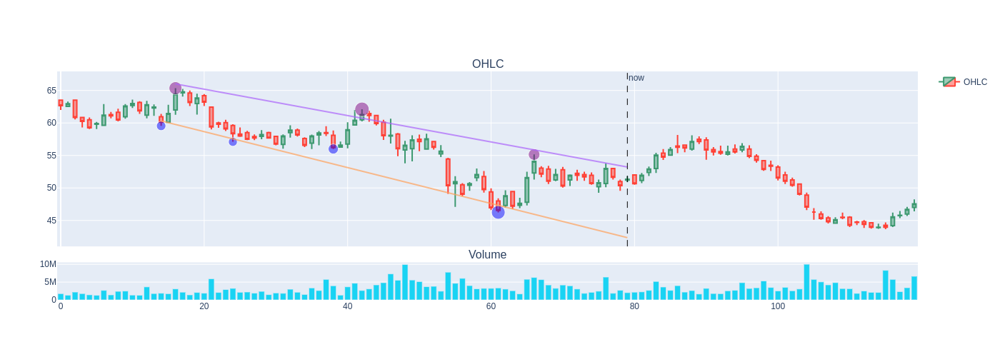

Hit any key for the next plot! 'q' for exit. 


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                             | 5126/6980 [01:24<00:06, 271.22it/s]

 best_lower_trend_line:  {'line_x': array([17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([38.88133974, 39.0001318 , 39.11892386, 39.23771592, 39.35650798,
       39.47530005, 39.59409211, 39.71288417, 39.83167623, 39.95046829,
       40.06926035, 40.18805241, 40.30684447, 40.42563653, 40.54442859,
       40.66322065, 40.78201271, 40.90080477, 41.01959683, 41.13838889,
       41.25718095, 41.37597301, 41.49476507, 41.61355713, 41.73234919,
       41.85114125, 41.96993331, 42.08872537, 42.20751743, 42.32630949,
       42.44510156, 42.56389362, 42.68268568, 42.80147774, 42.9202698 ,
       43.03906186, 43.15785392, 43.27664598, 43.39543804, 43.5142301 ,
       43.63302216, 43.75181422, 43.87060628, 43.98939834, 44.1081904 ,
       44.22698246, 44.3

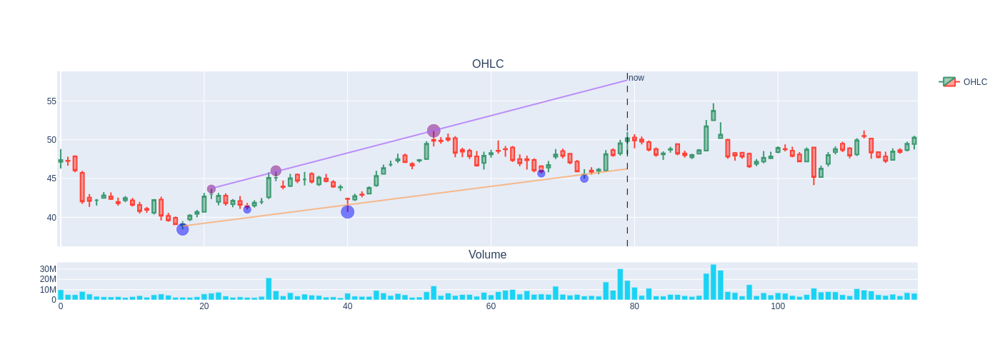

Hit any key for the next plot! 'q' for exit. 


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                       | 5358/6980 [01:25<00:05, 290.75it/s]

 best_lower_trend_line:  {'line_x': array([15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,
       32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48,
       49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65,
       66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([58.29807692, 58.19711538, 58.09615385, 57.99519231, 57.89423077,
       57.79326923, 57.69230769, 57.59134615, 57.49038462, 57.38942308,
       57.28846154, 57.1875    , 57.08653846, 56.98557692, 56.88461538,
       56.78365385, 56.68269231, 56.58173077, 56.48076923, 56.37980769,
       56.27884615, 56.17788462, 56.07692308, 55.97596154, 55.875     ,
       55.77403846, 55.67307692, 55.57211538, 55.47115385, 55.37019231,
       55.26923077, 55.16826923, 55.06730769, 54.96634615, 54.86538462,
       54.76442308, 54.66346154, 54.5625    , 54.46153846, 54.36057692,
       54.25961538, 54.15865385, 54.05769231, 53.95673077, 53.85576923,
       53.754807

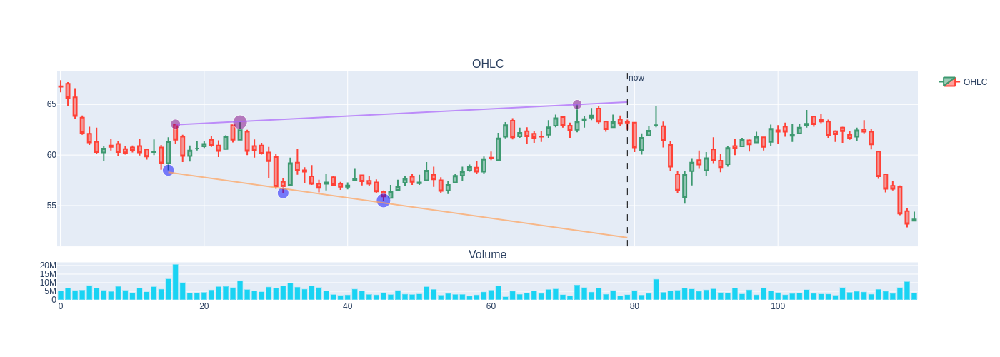

Hit any key for the next plot! 'q' for exit. 


 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                      | 5407/6980 [01:25<00:10, 144.66it/s]

 best_lower_trend_line:  {'line_x': array([11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([56.39261487, 56.34129689, 56.28997891, 56.23866094, 56.18734296,
       56.13602498, 56.084707  , 56.03338902, 55.98207105, 55.93075307,
       55.87943509, 55.82811711, 55.77679914, 55.72548116, 55.67416318,
       55.6228452 , 55.57152722, 55.52020925, 55.46889127, 55.41757329,
       55.36625531, 55.31493734, 55.26361936, 55.21230138, 55.1609834 ,
       55.10966542, 55.05834745, 55.00702947, 54.95571149, 54.90439351,
       54.85307554, 54.80175756, 54.75043958, 54.6991216 , 54.64780362,
       54.59648565, 54.54516767, 54.49384969, 54.44253171, 54.39121374,
       54.33989576, 54.28857778, 54.2372598 , 54.18594182, 54.134

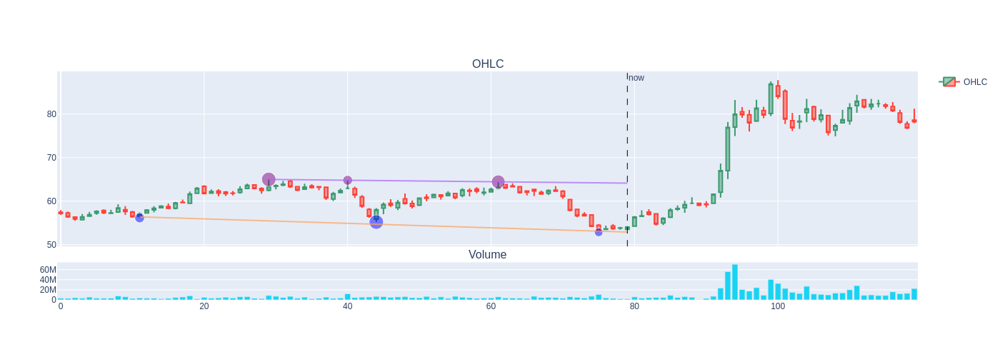

Hit any key for the next plot! 'q' for exit. 


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 5677/6980 [01:27<00:04, 269.28it/s]

 best_lower_trend_line:  {'line_x': array([13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
       30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46,
       47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,
       64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([73.15046981, 72.8729522 , 72.59543458, 72.31791696, 72.04039934,
       71.76288172, 71.48536411, 71.20784649, 70.93032887, 70.65281125,
       70.37529363, 70.09777602, 69.8202584 , 69.54274078, 69.26522316,
       68.98770554, 68.71018793, 68.43267031, 68.15515269, 67.87763507,
       67.60011745, 67.32259984, 67.04508222, 66.7675646 , 66.49004698,
       66.21252936, 65.93501175, 65.65749413, 65.37997651, 65.10245889,
       64.82494127, 64.54742366, 64.26990604, 63.99238842, 63.7148708 ,
       63.43735318, 63.15983557, 62.88231795, 62.60480033, 62.32728271,
       62.04976509, 61.77224748, 61.49472986, 61.21721224, 60.93969462,
       6

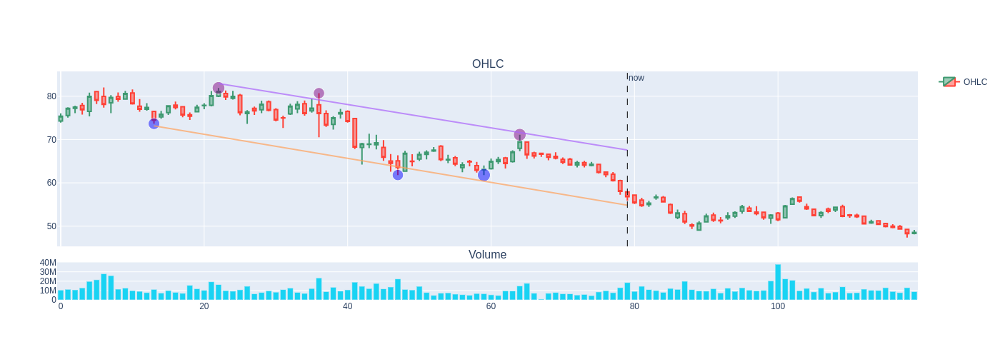

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79]), 'line_y': array([75.61965457, 75.24265829, 74.86566201, 74.48866573, 74.11166945,
       73.73467317, 73.35767689, 72.98068061, 72.60368433, 72.22668805,
       71.84969177, 71.47269549, 71.09569921, 70.71870293, 70.34170665,
       69.96471037, 69.58771409, 69.21071781, 68.83372153, 68.45672525,
       68.07972897, 67.70273269, 67.32573641, 66.94874013, 66.57174385,
       66.19474757, 65.81775129, 65.44075501, 65.06375873, 64.68676245,
       64.30976617, 63.93276989, 63.55577361, 63.17877733, 62.80178105,
       62.42478477, 62.04778849, 61.67079221, 61.29379593, 60.91679965,
       60.53980337, 60.16280709, 59.78581

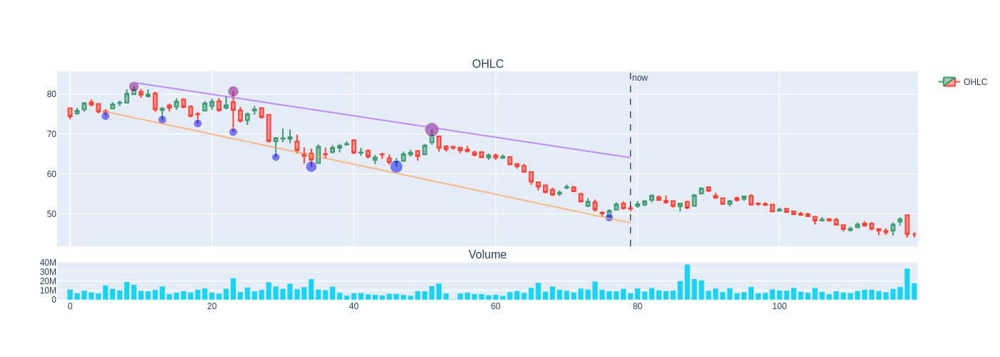

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([63.44102478, 63.11281967, 62.78461456, 62.45640945, 62.12820435,
       61.79999924, 61.47179413, 61.14358902, 60.81538391, 60.4871788 ,
       60.15897369, 59.83076859, 59.50256348, 59.17435837, 58.84615326,
       58.51794815, 58.18974304, 57.86153793, 57.53333282, 57.20512772,
       56.87692261, 56.5487175 , 56.22051239, 55.89230728, 55.56410217,
       55.23589706, 54.90769196, 54.57948685, 54.25128174, 53.92307663,
       53.59487152, 53.26666641, 52.9384613 , 52.6102562 , 52.28205109,
       51.95384598, 51.62564087, 51.29743576, 50.96923065, 50.64102554,
       50.31282043, 49.98461533, 49.65641022, 49.32820511, 49.        ,
       48.67179489, 48.34358978, 48.

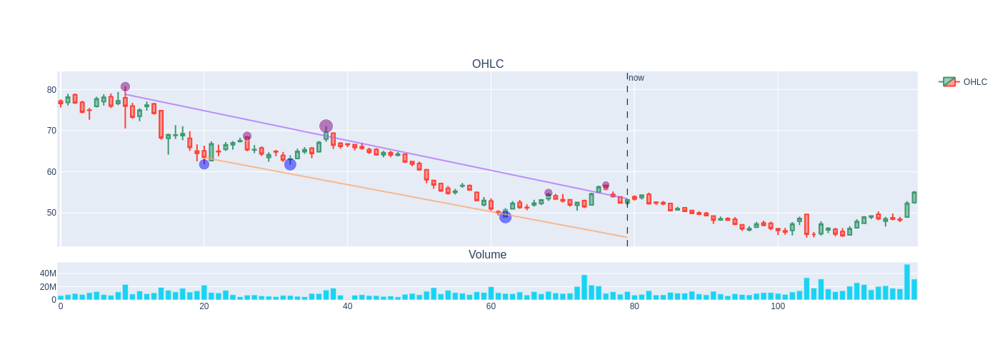

Hit any key for the next plot! 'q' for exit. 


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 5774/6980 [01:30<00:16, 73.08it/s]

 best_lower_trend_line:  {'line_x': array([28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44,
       45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61,
       62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78,
       79]), 'line_y': array([43.93683673, 44.15002992, 44.36322311, 44.5764163 , 44.78960948,
       45.00280267, 45.21599586, 45.42918904, 45.64238223, 45.85557542,
       46.06876861, 46.28196179, 46.49515498, 46.70834817, 46.92154135,
       47.13473454, 47.34792773, 47.56112092, 47.7743141 , 47.98750729,
       48.20070048, 48.41389366, 48.62708685, 48.84028004, 49.05347323,
       49.26666641, 49.4798596 , 49.69305279, 49.90624597, 50.11943916,
       50.33263235, 50.54582554, 50.75901872, 50.97221191, 51.1854051 ,
       51.39859828, 51.61179147, 51.82498466, 52.03817785, 52.25137103,
       52.46456422, 52.67775741, 52.89095059, 53.10414378, 53.31733697,
       53.53053016, 53.74372334, 53.95691653, 54.17010972, 54.383302

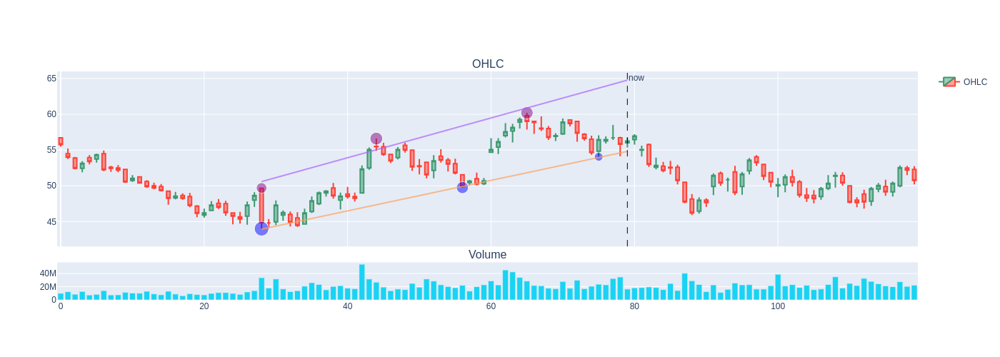

Hit any key for the next plot! 'q' for exit. 


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 6068/6980 [01:31<00:04, 226.37it/s]

 best_lower_trend_line:  {'line_x': array([14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,
       31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
       48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64,
       65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([24.86727459, 24.97585085, 25.08442711, 25.19300337, 25.30157963,
       25.41015589, 25.51873215, 25.62730842, 25.73588468, 25.84446094,
       25.9530372 , 26.06161346, 26.17018972, 26.27876598, 26.38734224,
       26.49591851, 26.60449477, 26.71307103, 26.82164729, 26.93022355,
       27.03879981, 27.14737607, 27.25595233, 27.3645286 , 27.47310486,
       27.58168112, 27.69025738, 27.79883364, 27.9074099 , 28.01598616,
       28.12456242, 28.23313869, 28.34171495, 28.45029121, 28.55886747,
       28.66744373, 28.77601999, 28.88459625, 28.99317251, 29.10174878,
       29.21032504, 29.3189013 , 29.42747756, 29.53605382, 29.64463008,
       29.75

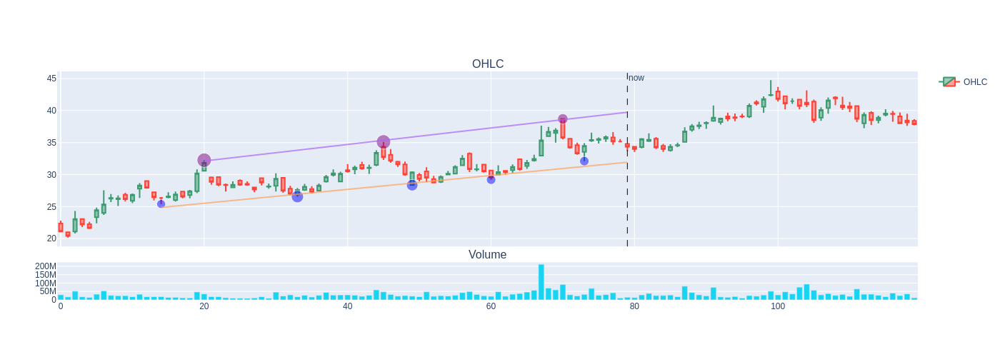

Hit any key for the next plot! 'q' for exit. 


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 6112/6980 [01:32<00:06, 124.83it/s]

 best_lower_trend_line:  {'line_x': array([ 4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20,
       21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37,
       38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54,
       55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
       72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([24.65427269, 24.77315637, 24.89204004, 25.01092372, 25.12980739,
       25.24869107, 25.36757474, 25.48645842, 25.60534209, 25.72422577,
       25.84310944, 25.96199312, 26.08087679, 26.19976047, 26.31864414,
       26.43752782, 26.55641149, 26.67529517, 26.79417884, 26.91306252,
       27.03194619, 27.15082987, 27.26971354, 27.38859722, 27.50748089,
       27.62636457, 27.74524824, 27.86413192, 27.98301559, 28.10189927,
       28.22078294, 28.33966662, 28.45855029, 28.57743396, 28.69631764,
       28.81520131, 28.93408499, 29.05296866, 29.17185234, 29.29073601,
       29.40961969, 29.52850336, 29.6

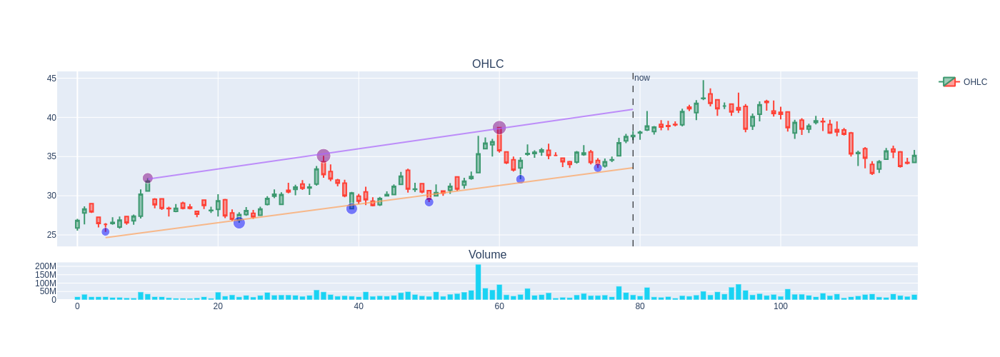

Hit any key for the next plot! 'q' for exit. 


 best_lower_trend_line:  {'line_x': array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,
       53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
       70, 71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([27.80642434, 27.98484122, 28.16325811, 28.34167499, 28.52009187,
       28.69850875, 28.87692564, 29.05534252, 29.2337594 , 29.41217628,
       29.59059316, 29.76901005, 29.94742693, 30.12584381, 30.30426069,
       30.48267758, 30.66109446, 30.83951134, 31.01792822, 31.19634511,
       31.37476199, 31.55317887, 31.73159575, 31.91001263, 32.08842952,
       32.2668464 , 32.44526328, 32.62368016, 32.80209705, 32.98051393,
       33.15893081, 33.33734769, 33.51576457, 33.69418146, 33.87259834,
       34.05101522, 34.2294321 , 34.40784899, 34.58626587, 34.76468275,
       34.94309963, 35.12151651, 35.2999334 , 35.47835028, 35.65676716,
       35.83518404, 36.01360093,

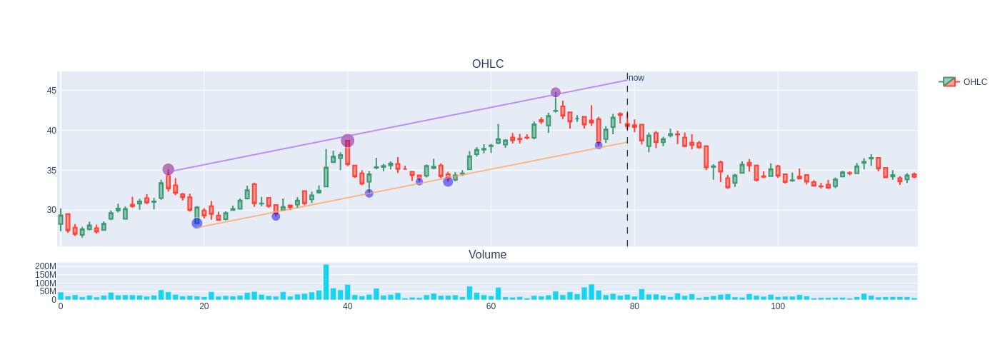

Hit any key for the next plot! 'q' for exit. 


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 6316/6980 [01:34<00:04, 156.75it/s]

 best_lower_trend_line:  {'line_x': array([37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79]), 'line_y': array([117.01676265, 117.16087468, 117.30498671, 117.44909874,
       117.59321077, 117.7373228 , 117.88143483, 118.02554687,
       118.1696589 , 118.31377093, 118.45788296, 118.60199499,
       118.74610702, 118.89021905, 119.03433108, 119.17844311,
       119.32255514, 119.46666718, 119.61077921, 119.75489124,
       119.89900327, 120.0431153 , 120.18722733, 120.33133936,
       120.47545139, 120.61956342, 120.76367545, 120.90778749,
       121.05189952, 121.19601155, 121.34012358, 121.48423561,
       121.62834764, 121.77245967, 121.9165717 , 122.06068373,
       122.20479576, 122.34890779, 122.49301983, 122.63713186,
       122.78124389, 122.92535592, 123.06946795]), 'points_x': array([69, 56, 37]), 'points_y': array([121.75      , 119.55000305

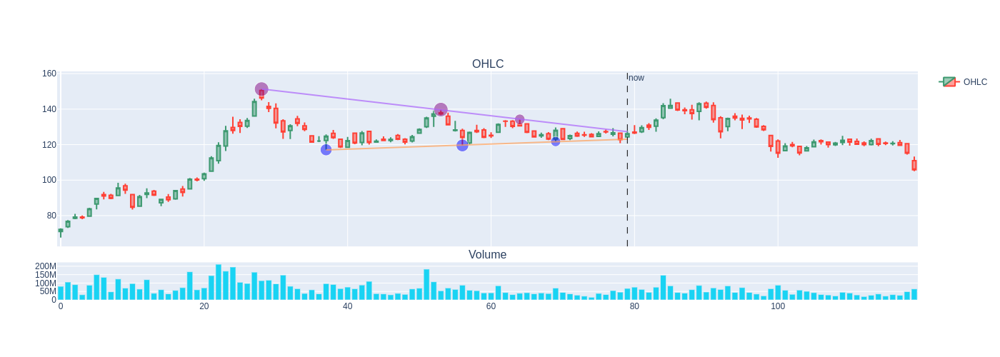

Hit any key for the next plot! 'q' for exit. 


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 6450/6980 [01:35<00:03, 173.27it/s]

 best_lower_trend_line:  {'line_x': array([22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79]), 'line_y': array([104.84511751, 104.4189641 , 103.99281069, 103.56665727,
       103.14050386, 102.71435045, 102.28819704, 101.86204362,
       101.43589021, 101.0097368 , 100.58358339, 100.15742997,
        99.73127656,  99.30512315,  98.87896974,  98.45281632,
        98.02666291,  97.6005095 ,  97.17435608,  96.74820267,
        96.32204926,  95.89589585,  95.46974243,  95.04358902,
        94.61743561,  94.1912822 ,  93.76512878,  93.33897537,
        92.91282196,  92.48666855,  92.06051513,  91.63436172,
        91.20820831,  90.78205489,  90.35590148,  89.92974807,
        89.50359466,  89.07744124,  88.65128783,  88.22513442,
        87.79898101,  87.37282759,  86.94667418,  86.52052077,

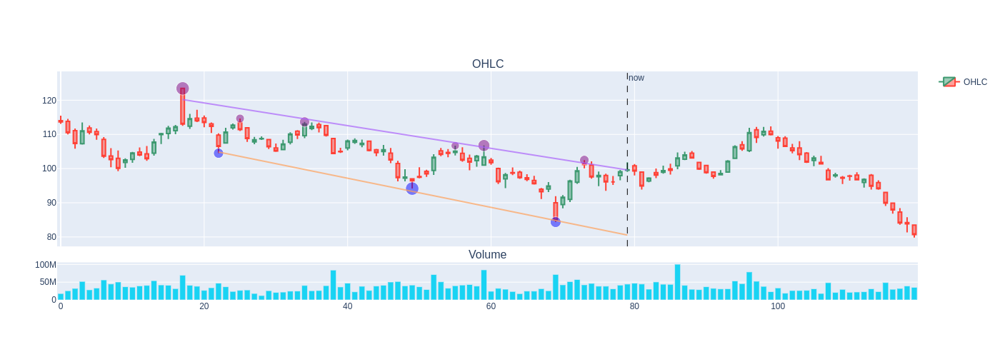

Hit any key for the next plot! 'q' for exit. 


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6980/6980 [01:37<00:00, 71.83it/s]


In [5]:
WINDOW_SIZE = 80










PLOT_FUTURE_PERIODS = 40

last_plotted_i = -999

for i in tqdm(range(WINDOW_SIZE, ohlcv.shape[0])):
    o = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 0].values
    h = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 1].values
    l = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 2].values
    c = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 3].values
    v = ohlcv.iloc[i-WINDOW_SIZE+1:i+1, 5].values

    best_lower_trend_line, best_lower_trend_stats, best_upper_trend_line, best_upper_trend_stats, best_channel_score = get_best_channel(
        h=h, l=l, c=c,
        max_rank_possible=20,
        min_rank_for_detection=3,
        min_pivot_point_count=3,
        max_age_latest_pivot_point=20,
        min_r_squared=0.9,
        max_p_value=0.5,
        max_crossing_perc=0.05,
        min_pivot_points_inbetween=1
    )

    if best_channel_score < 1000:
        continue

    # This is just to prevent plotting the same channels a lot times in a row,
    # so the very first appearance of the channel is shown
    if i - last_plotted_i < 10:
        continue

    print(" best_lower_trend_line: ", best_lower_trend_line)
    print("best_lower_trend_stats: ", best_lower_trend_stats)
    print(" best_upper_trend_line: ", best_upper_trend_line)
    print("best_upper_trend_stats: ", best_upper_trend_stats)
    print("    best_channel_score: ", best_channel_score)

    plot_future_periods = min(i+PLOT_FUTURE_PERIODS+1, ohlcv.shape[0])
    o1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 0].values
    h1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 1].values
    l1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 2].values
    c1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 3].values
    v1 = ohlcv.iloc[i-WINDOW_SIZE+1:plot_future_periods, 5].values

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                vertical_spacing=0.07, subplot_titles=('OHLC', 'Volume'),
                row_width=[0.15, 0.7], )

    fig.add_trace(go.Candlestick(
        x=np.arange(o1.shape[0]),
        open=o1,
        high=h1,
        low=l1,
        close=c1,
        name="OHLC"),
        row=1, col=1
    )

    fig.add_trace(go.Scatter(x=best_upper_trend_line["points_x"], y=best_upper_trend_line["points_y"], text=['Rank: {}'.format(r) for r in best_upper_trend_line["points_weights"]], mode="markers",opacity=0.7, marker=dict(
            color='Purple',
            size=best_upper_trend_line["points_weights"]/2+10
        ), showlegend=False), row=1, col=1)
    fig.add_trace(go.Scatter(x=best_lower_trend_line["points_x"], y=best_lower_trend_line["points_y"], text=['Rank: {}'.format(r) for r in best_lower_trend_line["points_weights"]], mode="markers", opacity=0.7, marker=dict(
            color='Blue',
            size=best_lower_trend_line["points_weights"]/2+10
        ), showlegend=False), row=1, col=1)
    fig.add_trace(go.Scatter(x=best_upper_trend_line["line_x"], y=best_upper_trend_line["line_y"], opacity=0.7, showlegend=False, text=f"Error: {best_upper_trend_stats['err']}<br>R: {best_upper_trend_stats['r']}<br>P: {best_upper_trend_stats['p']}"), row=1, col=1)
    fig.add_trace(go.Scatter(x=best_lower_trend_line["line_x"], y=best_lower_trend_line["line_y"], opacity=0.7, showlegend=False, text=f"Error: {best_lower_trend_stats['err']}<br>R: {best_lower_trend_stats['r']}<br>P: {best_lower_trend_stats['p']}"), row=1, col=1)

    fig.add_vline(x=WINDOW_SIZE-1, line_width=1, line_dash="dash", line_color="black", row=1, col=1, annotation_text="now")

    fig.add_trace(go.Bar(x=np.arange(o1.shape[0]), y=v1, showlegend=False), row=2, col=1)
    fig.update_layout(height=500, width=800)
    fig.update(layout_xaxis_rangeslider_visible=False)
    fig.show()

    last_plotted_i = i

    if input("Hit any key for the next plot! 'q' for exit.").lower().strip() == "q":
        break

